Testing out bead finder thresholding

In [2]:
from metadata import Metadata
pos = 'Pos0'
hybe = 'hybe1'
md = Metadata('/mnt/HypeScope/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17')
test_stk = md.stkread(Channel='DeepBlue',Position=pos, hybe=hybe)

opening img_Pos0_000000081_000000000_DeepBlue_000_081.tif

<IPython.core.display.Javascript object>


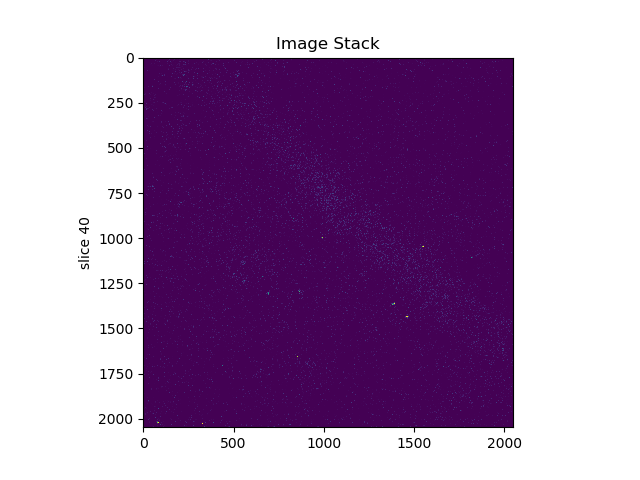

In [15]:
import matplotlib.pyplot as plt
import matplotlib
from pyvis import *
%matplotlib notebook
stkshow(test_stk,min_thresh=90, max_thresh=99.99)

In [16]:
import numpy as np
import copy
max_proj = np.max(test_stk,axis=2)
thresh_stk = copy.copy(test_stk)
thresh = np.percentile(max_proj,70)
thresh_stk[thresh_stk<thresh]=0

<IPython.core.display.Javascript object>


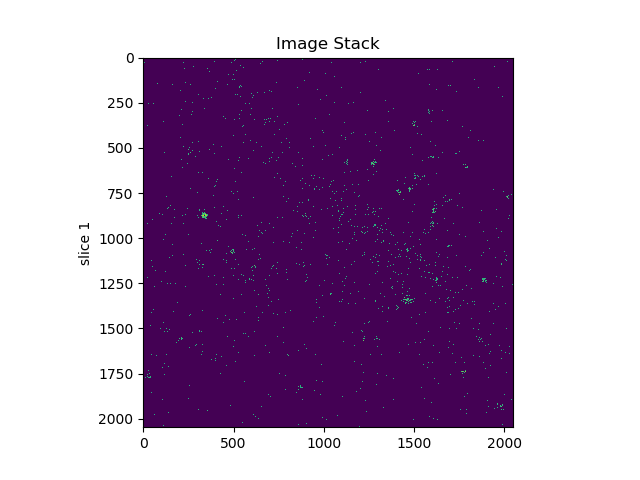

In [27]:
%matplotlib notebook
stkshow(thresh_stk,min_thresh=90, max_thresh=99.99)

In [35]:
from scipy import ndimage
blurr_stk_no_thresh = ndimage.gaussian_filter(test_stk,1)

<IPython.core.display.Javascript object>


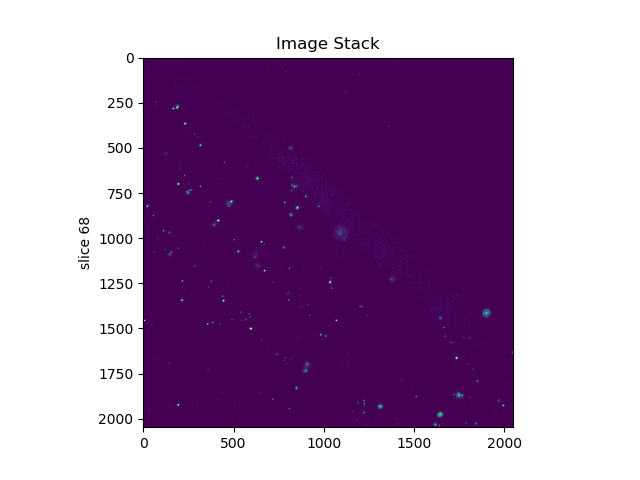

In [32]:
%matplotlib notebook
stkshow(blurr_stk,min_thresh=90, max_thresh=99.99)

<IPython.core.display.Javascript object>


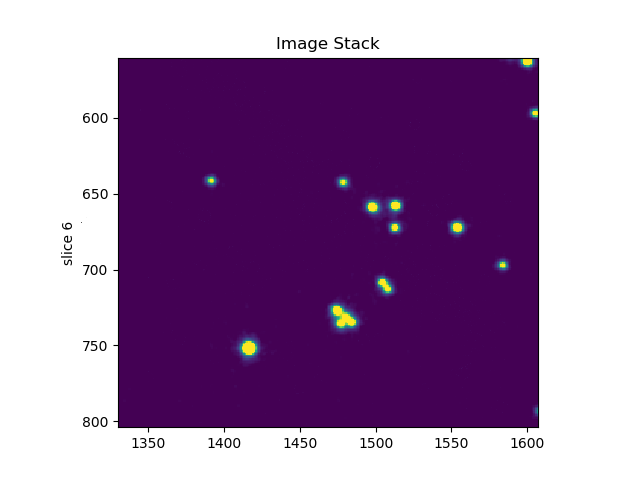

In [36]:
%matplotlib notebook
stkshow(blurr_stk_no_thresh,min_thresh=90, max_thresh=99.99)

In [20]:
max_proj = np.max(test_stk,axis=2)
max_proj_max = max_proj.max()
max_proj_min = max_proj.min()
print(max_proj_max,max_proj_min)
test = (max_proj-max_proj_min)/(max_proj_max-max_proj_min)
test_max = test.max()
test_min = test.min()
print(test_max,test_min)
test = (max_proj)/(max_proj_max)
test_max = test.max()
test_min = test.min()
print(test_max,test_min)

26485 1567
1.0 0.0
1.0 0.0591655654143855


In [1]:
import datetime
from metadata import *
import trackpy
from functools import partial
import multiprocessing
from hybescope_config.microscope_config import *
from scipy import ndimage
import os
import pickle
import numpy as np
import copy

def new_find_beads(out_path,md,pos,hybe):
    if os.path.exists(os.path.join(out_path,pos,hybe,'bead.pkl')):
        bead_df = pickle.load(open(os.path.join(out_path,pos,hybe,'bead.pkl'),'rb'))
    else:
        start = datetime.datetime.now()
        temp_stk = md.stkread(Channel='DeepBlue',Position=pos, hybe=hybe)
        temp_max = temp_stk.max()
        temp_min = temp_stk.min()
        temp_stk = (temp_stk-temp_min)/(temp_max-temp_min)
        for y, x in hot_pixels:
            temp_stk[y, x,:] = 0;
#         proj = np.max(temp_stk,axis=2)
#         thresh_stk = copy.copy(temp_stk)
#         thresh = np.percentile(proj,70)
#         thresh_stk[thresh_stk<thresh]=0
        thresh_stk = ndimage.gaussian_filter(temp_stk,1) 
        bead_df = trackpy.locate(thresh_stk,(5,7,7),percentile=90, preprocess=False,engine='numba')
        end = datetime.datetime.now()
        if not os.path.exists(out_path):
            print('out path doesnt exist')
        if not os.path.exists(os.path.join(out_path,pos)):
            os.mkdir(os.path.join(out_path,pos))
        if not os.path.exists(os.path.join(out_path,pos,hybe)):
            os.mkdir(os.path.join(out_path,pos,hybe))
        pickle.dump(bead_df, open(os.path.join(out_path,pos,hybe,'bead.pkl'),'wb'))
        print('\n','Started',pos,hybe,'at',start)
        print('\n','Ended',pos,hybe,'at',end)
    return bead_df,pos,hybe
pos = 'Pos1'
hybe = 'hybe1'
md = Metadata('/mnt/HypeScope/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17')
out_path = '/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17'
bead_df,pos,hybe = new_find_beads(out_path,md,pos,hybe)

opening img_Pos1_000000081_000000000_DeepBlue_000_081.tif
 Started Pos1 hybe1 at 2018-10-09 12:47:10.527740

 Ended Pos1 hybe1 at 2018-10-09 13:47:50.762475


In [2]:
bead_df

,z,y,x,mass,size_z,size_y,size_x,ecc,signal,raw_mass,ep_z,ep_y,ep_x
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<IPython.core.display.Javascript object>


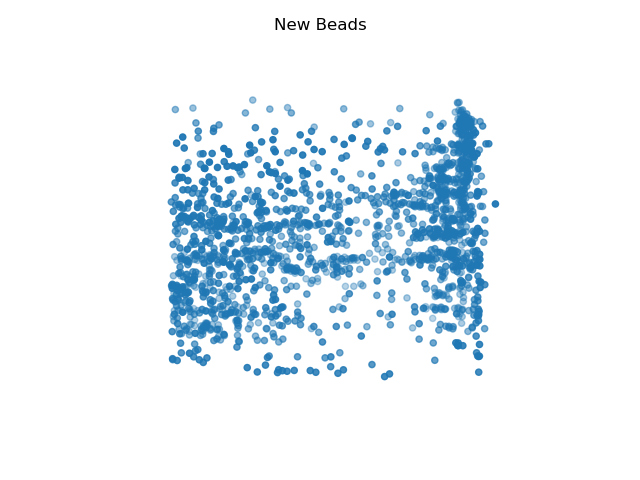

In [26]:
%matplotlib notebook
import pickle
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d, Axes3D
fig = plt.figure()
ax = Axes3D(fig)
dictionary = {}
dictionary['hybe1'] = bead_df
for h in dictionary.keys():
    X, Y, Z = dictionary[h]['x'], dictionary[h]['y'], dictionary[h]['z']
    cset = ax.scatter(X, Y, Z)
    ax.clabel(cset, fontsize=9, inline=1)
ax.grid(False)
plt.title('New Beads')
plt.axis('off')
plt.show()

<IPython.core.display.Javascript object>


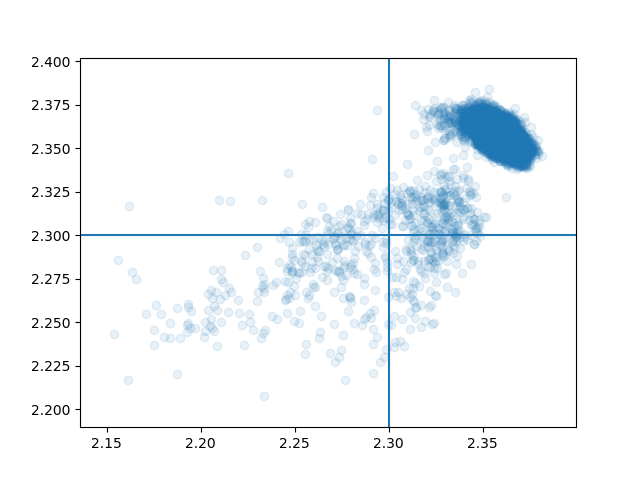

In [3]:
%matplotlib notebook
import matplotlib.pyplot as plt
plt.scatter(bead_df['size_x'],bead_df['size_y'],alpha=0.1)
plt.axvline(2.3)
plt.axhline(2.3)

<IPython.core.display.Javascript object>


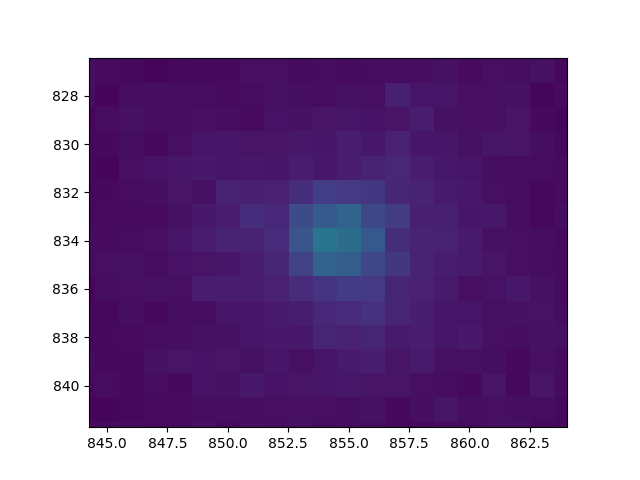

In [12]:
%matplotlib notebook
plt.imshow(max_proj)

In [97]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os
import multiprocessing as mp
import pickle
from itertools import repeat
from collections import defaultdict
from functools import partial
from skimage import io, restoration
from scipy.ndimage import gaussian_filter
from scipy import interpolate
from metadata import *
from skimage.filters import gaussian, threshold_adaptive, threshold_local
from scipy import ndimage
from skimage.morphology import selem, watershed, remove_small_objects
from skimage.measure import regionprops, label
from skimage import feature
from scipy.spatial import distance_matrix
from sklearn.cluster import DBSCAN
import imreg_dft as ird
import bisect
from skimage.color import label2rgb

In [8]:
import pickle
bead = pickle.load(open('/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/bead_testing/Pos0/hybe1/bead.pkl','rb'))

In [17]:
path = '/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/bead_testing'
bead_dict = {}
for pos in os.listdir(path):
    bead_dict[pos] = {}
    for hybe in os.listdir(os.path.join(path,pos)):
        bead_dict[pos][hybe] = pickle.load(open(os.path.join(path,pos,hybe,'bead.pkl'),'rb'))

In [16]:
bead_dict['Pos1']

,z,y,x,mass,size_z,size_y,size_x,ecc,signal,raw_mass,ep_z,ep_y,ep_x
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2.006107,5.984733,9.016031,5.137255,1.430849,2.364818,2.345859,NaN,0.086275,5.294029,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<IPython.core.display.Javascript object>


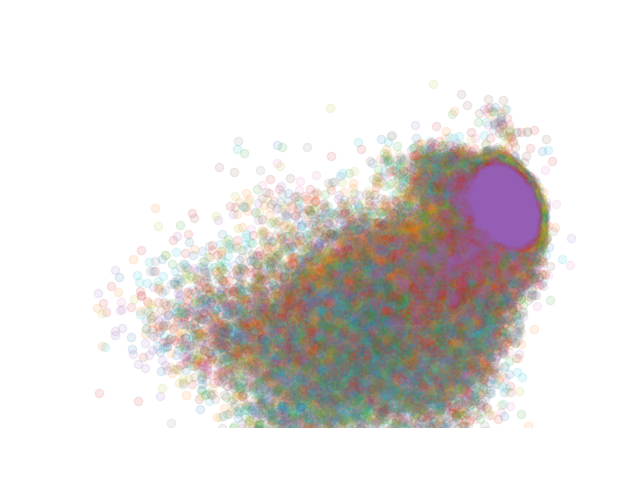

In [18]:
%matplotlib notebook
import matplotlib.pyplot as plt
for pos in bead_dict.keys():
    for hybe in bead_dict[pos].keys():
        bead = bead_dict[pos][hybe]
        plt.scatter(bead['size_x'],bead['size_y'],alpha=0.1)
plt.axvline(2.3)
plt.axhline(2.3)

<IPython.core.display.Javascript object>


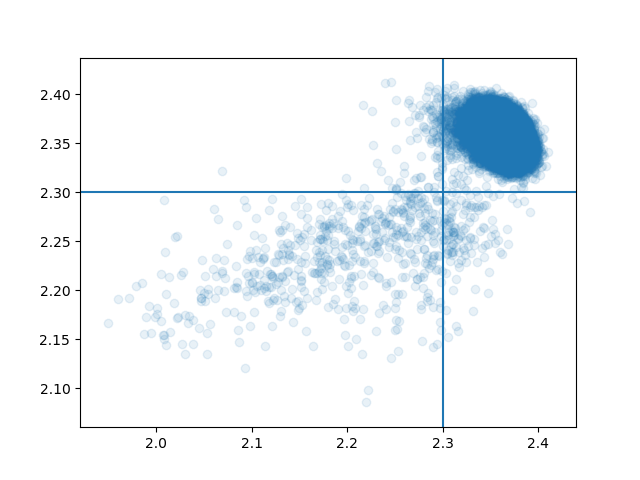

In [10]:
%matplotlib notebook
import matplotlib.pyplot as plt
plt.scatter(bead['size_x'],bead['size_y'],alpha=0.1)
plt.axvline(2.3)
plt.axhline(2.3)

In [7]:
from fish_results import*
import numpy as np
import os
import multiprocessing
def make_nf(hdata,pos,nf_init_qtile=95):
    print(pos)
    for z in hdata.metadata.zindex.unique():
        nf = [400,400,400,400,400,400,400,400,400,400,400,400,400,400,400,400,400,400]
        hdata.add_and_save_data(nf, pos, z, 'nf')

cstk_path = '/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/codestacks/'
hybedatas = [(i, HybeData(os.path.join(cstk_path, i))) for i in os.listdir(cstk_path) if os.path.isdir(os.path.join(cstk_path, i))]
ncpu = 12
with multiprocessing.Pool(ncpu) as ppool:
    ppool.starmap(make_nf, [(i[1], i[0]) for i in hybedatas])

No columns to parse from file
Pos26
Pos28
Pos17
Pos22
Pos26 10
Pos28 10
Pos50
Pos22 10
Pos48
Pos1
Pos24
Pos32
Pos21
Pos30
Pos50 10
Pos48 10
Pos14
Pos1 10
Pos17 10
Pos24 10
Pos14 10
Pos21 10
Pos30 10
Pos34
Pos22 13
Pos34 10
Pos28 13
Pos26 13
Pos50 13
Pos24 13
Pos1 13
Pos48 13
Pos28 16
Pos22 16
Pos14 13
Pos24 16
Pos28 19
Pos50 16
Pos26 16
Pos22 19
Pos30 13
Pos17 13
Pos48 16
Pos21 13
Pos24 19
Pos14 16
Pos28 22
Pos34 13
Pos1 16
Pos22 22
Pos50 19
Pos26 19
Pos14 19
Pos28 25
Pos24 22
Pos48 19
Pos30 16
Pos17 16
Pos34 16
Pos22 25
Pos50 22
Pos14 22
Pos24 25
Pos1 19
Pos21 16
Pos28 28
Pos26 22
Pos48 22
Pos24 28
Pos34 19
Pos50 25
Pos22 28
Pos14 25
Pos28 31
Pos17 19
Pos30 19
Pos50 28
Pos1 22
Pos21 19
Pos48 25
Pos24 31
Pos22 31
Pos28 34
Pos14 28
Pos34 22
Pos26 25
Pos30 22
Pos17 22
Pos50 31
Pos24 34
Pos22 34
Pos48 28
Pos1 25
Pos28 37
Pos14 31
Pos34 25
Pos21 22
Pos50 34
Pos24 37
Pos26 28
Pos17 25
Pos30 25
Pos22 37
Pos28 40
Pos1 28
Pos48 31
Pos14 34
Pos24 40
Pos50 37
Pos34 28
Pos22 40
Pos48 34
Pos30 28


Pos39 58
Pos29 61
Pos45 46
Pos31 46
Pos4 40
Pos3 64
Pos49 67
Pos6 49
Pos2 46
Pos23 52
Pos0 31
Pos29 64
Pos45 49
Pos31 49
Pos39 61
Pos38 43
Pos3 67
Pos49 70
Pos29 67
Pos45 52
Pos2 49
Pos6 52
Pos31 52
Pos23 55
Pos3 70
Pos49 73
Pos29 70
Pos0 34
Pos45 55
Pos4 43
Pos31 55
Pos38 46
Pos2 52
Pos39 64
Pos6 55
Pos23 58
Pos31 58
Pos49 76
Pos45 58
Pos39 67
Pos3 73
Pos29 73
Pos2 55
Pos6 58
Pos4 46
Pos23 61
Pos38 49
Pos0 37
Pos31 61
Pos45 61
Pos39 70
Pos49 79
Pos29 76
Pos2 58
Pos3 76
Pos6 61
Pos23 64
Pos31 64
Pos39 73
Pos45 64
Pos4 49
Pos10
Pos38 52
Pos2 61
Pos10 10
Pos23 67
Pos31 67
Pos29 79
Pos6 64
Pos3 79
Pos0 40
Pos39 76
Pos45 67
Pos23 70
Pos31 70
Pos2 64
Pos10 13
Pos4 52
Pos38 55
Pos25
Pos6 67
Pos25 10
Pos39 79
Pos0 43
Pos45 70
Pos10 16
Pos2 67
Pos23 73
Pos31 73
Pos38 58
Pos47
Pos4 55
Pos25 13
Pos13
Pos6 70
Pos47 10
Pos13 10
Pos10 19
Pos38 61
Pos2 70
Pos45 73
Pos31 76
Pos23 76
Pos25 16
Pos13 13
Pos6 73
Pos0 46
Pos38 64
Pos4 58
Pos10 22
Pos2 73
Pos13 16
Pos45 76
Pos25 19
Pos23 79
Pos31 79
Pos6 7

In [11]:
def segmentHighResNuclei(img, thresh_nhood=251, erosion = 4, dilation=5,
                         min_size = 4048, label_connectivity = 2):
    """
    Segment nuclei using adaptive threshold, binary erosion, and dilation.
    """
    nuc_min = img
    smooth_nuc = gaussian(nuc_min, (4, 4))
    nuclei = threshold_adaptive(smooth_nuc, thresh_nhood)
    nuclei = ndimage.binary_erosion(nuclei, structure=selem.disk(erosion))
    nuclei = ndimage.binary_dilation(nuclei, structure=selem.disk(dilation))
    nuclei = remove_small_objects(nuclei, min_size=min_size)
    nuclei = ndimage.binary_fill_holes(nuclei)
    labels, num_label = label(nuclei, background=0, return_num=True, connectivity=label_connectivity)
    return labels, nuc_min

In [169]:
tforms = pickle.load(open('/hybedata/Zach/FISH_Troubleshooting/Transverse_Second_2018Aug24/Analysis/results/tforms.pkl','rb'))

In [170]:
tforms_path = '/hybedata/Zach/FISH_Troubleshooting/Transverse_Second_2018Aug24/Analysis/results/tforms.pkl'
good_positions = pickle.load(open(tforms_path, 'rb'))['good']

In [166]:
tforms_path2 = '/hybedata/Zach/FISH_Troubleshooting/Transverse_Second_2018Aug24/Analysis/results/tforms_new.pkl'
good_positions2 = pickle.load(open(tforms_path2, 'rb'))['good']
#for p, (t,q) in good_positions2.items():
    #print(t)
good_positions2['Pos1'][1]['hybe2']

{'nbeads': 170,
 'bead_outlier_ratio': 0.6938775510204082,
 'residual': 0.5972505895729234}

In [96]:
def unix_find(pathin):
    """Return results similar to the Unix find command run without options
    i.e. traverse a directory tree and return all the file paths
    """
    
    return [os.path.join(path, file)
            for (path, dirs, files) in os.walk(pathin)
            for file in dirs]
md_pth = '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Second_2018Aug24/Raw/'


['/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Second_2018Aug24/Raw/acq_1',
 '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Second_2018Aug24/Raw/acq_2',
 '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Second_2018Aug24/Raw/acq_3',
 '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Second_2018Aug24/Raw/hybe1_4',
 '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Second_2018Aug24/Raw/hybe2_7',
 '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Second_2018Aug24/Raw/hybe3_8',
 '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Second_2018Aug24/Raw/hybe4_9',
 '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Second_2018Aug24/Raw/hybe5_10',
 '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Second_2018Aug24/Raw/hybe6_11',
 '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Second_2018Aug24/Raw/hybe7_12',
 '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Second_2018Aug24/Raw/hybe8_13',
 

In [3]:
md_pth = '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Second_2018Aug24/Raw/'
md = Metadata(md_pth)
nuc_stk = md.stkread(Channel='DeepBlue', Position='Pos20', hybe='nucstain')
from skimage.color import label2rgb

/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/skimage/filters/thresholding.py:222: skimage_deprecation: Function ``threshold_adaptive`` is deprecated and will be removed in version 0.15. Use ``threshold_local`` instead.
  def threshold_adaptive(image, block_size, method='gaussian', offset=0,
/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/skimage/filters/thresholding.py:224: UserWarning: The return value of `threshold_local` is a threshold image, while `threshold_adaptive` returned the *thresholded* image.
  warn('The return value of `threshold_local` is a threshold image, while '


(-0.5, 2047.5, 2047.5, -0.5)

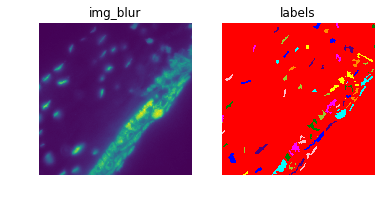

In [5]:
%matplotlib inline
img = nuc_stk[:,:,20]
img_blur = ndimage.gaussian_filter(img,1)
nuclei_thresh = threshold_adaptive(img_blur, 111)
nuclei_erode = ndimage.binary_erosion(nuclei_thresh, structure=selem.disk(4))
nuclei_dialate = ndimage.binary_dilation(nuclei_erode, structure=selem.disk(1))
nuclei_remove = remove_small_objects(nuclei_dialate, min_size=1500)
nuclei_fill = ndimage.binary_fill_holes(nuclei_remove)
nuclei_fill_erode = ndimage.binary_erosion(nuclei_fill, structure=selem.disk(3))
labels, num_label = label(nuclei_fill_erode, background=0, return_num=True, connectivity=1)
plt.subplot(121)
plt.imshow(img_blur)
plt.title('img_blur')
plt.axis('off')
plt.subplot(122)
plt.imshow(label2rgb(labels))
plt.title('labels')
plt.axis('off')

<IPython.core.display.Javascript object>


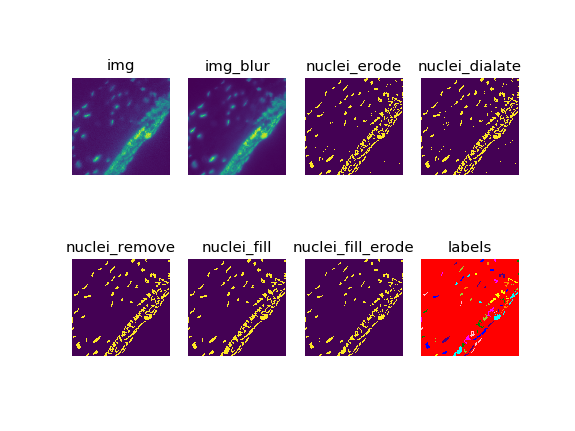

(-0.5, 2047.5, 2047.5, -0.5)

In [6]:
%matplotlib notebook
plt.subplot(241)
plt.imshow(img)
plt.title('img')
plt.axis('off')
plt.subplot(242)
plt.imshow(img_blur)
plt.title('img_blur')
plt.axis('off')
plt.subplot(243)
plt.imshow(nuclei_erode)
plt.title('nuclei_erode')
plt.axis('off')
plt.subplot(244)
plt.imshow(nuclei_dialate)
plt.title('nuclei_dialate')
plt.axis('off')
plt.subplot(245)
plt.imshow(nuclei_remove)
plt.title('nuclei_remove')
plt.axis('off')
plt.subplot(246)
plt.imshow(nuclei_fill)
plt.title('nuclei_fill')
plt.axis('off')
plt.subplot(247)
plt.imshow(nuclei_fill_erode)
plt.title('nuclei_fill_erode')
plt.axis('off')
plt.subplot(248)
plt.imshow(label2rgb(labels))
plt.title('labels')
plt.axis('off')

In [10]:
spot_stk = md.stkread(Channel='FarRed', Position='Pos0', hybe='hybe1')

opening img_Pos0_000000052_000000000_FarRed_000_052.tif

In [41]:
%matplotlib notebook
from __future__ import print_function
class stkshow(object):
    def __init__(self, X, min_thresh=1,max_thresh=99):
        self.fig, self.ax = plt.subplots(1,1)
        self.ax.set_title('Image Stack') # Title

        self.X = X
        rows, cols, self.slices = X.shape
        self.ind = self.slices//2
        self.vmin = np.percentile(self.X,min_thresh)
        self.vmax = np.percentile(self.X,max_thresh)
        self.im = self.ax.imshow(self.X[:, :, self.ind], vmin=self.vmin, vmax=self.vmax)
        self.fig.canvas.mpl_connect('scroll_event', self.onscroll)
        self.update()

    def onscroll(self, event):
        print("%s %s" % (event.button, event.step))
        if event.button == 'up':
            self.ind = (self.ind + 1) % self.slices
        else:
            self.ind = (self.ind - 1) % self.slices
        self.update()

    def update(self):
        self.im.set_data(self.X[:, :, self.ind])
        self.ax.set_ylabel('slice %s' % self.ind)
        self.im.axes.figure.canvas.draw()
        plt.show()


<IPython.core.display.Javascript object>


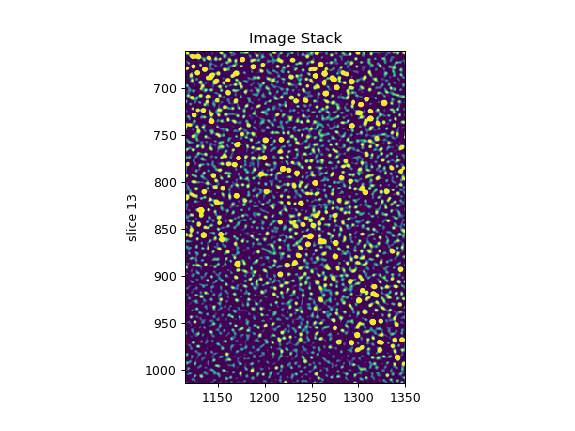

In [44]:
stkshow(spot_stk,min_thresh=80,max_thresh=99)

<IPython.core.display.Javascript object>


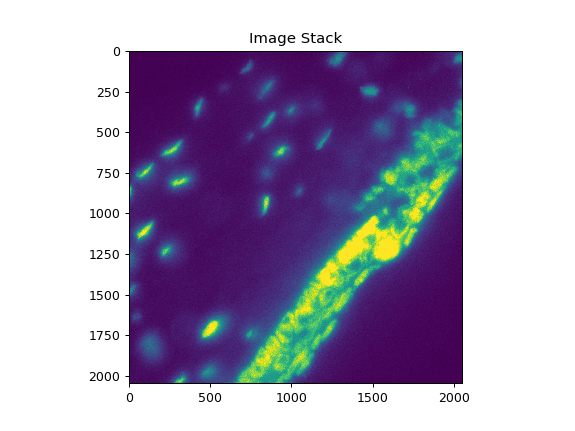

In [184]:
%matplotlib notebook
stkshow(nuc_stk)

In [41]:
bead_pkl_savepth = '/data/Transverse_Second_2018Aug24/Avg_Bead_Substacks/substacks.pkl'
folders = ['Avg_Bead_Substacks'] # list of seperate files of bead data
substack_dicts = defaultdict(dict)
for f in folders:
    npth = os.path.join(md_pth, f)
    filez = !find {npth} -type f
    for fi in filez:
        d = pickle.load(open(fi, 'rb'))
        d = {k.split('_')[0]:v for k, v in d.items()}
        bpth, pos = os.path.split(fi)
        substack_dicts[pos].update(d)
pickle.dump(substack_dicts, open(bead_pkl_savepth, 'wb'))

In [50]:
pos = next(iter(substack_dicts.keys()))
hybe = next(iter(substack_dicts[pos].keys()))
bead = next(iter(substack_dicts[pos][hybe].keys()))  
Average_Bead1 = substack_dicts[pos][hybe][bead][:,:,0]
Average_Bead2 = substack_dicts[pos][hybe][bead][:,:,1]
Average_Bead3 = substack_dicts[pos][hybe][bead][:,:,2]
Average_Bead4 = substack_dicts[pos][hybe][bead][:,:,3]
Average_Bead5 = substack_dicts[pos][hybe][bead][:,:,4]
Average_Bead6 = substack_dicts[pos][hybe][bead][:,:,5]
Average_Bead7 = substack_dicts[pos][hybe][bead][:,:,6]
for pos in substack_dicts.keys():
    for hyb in substack_dicts[pos].keys():
        for bead in substack_dicts[pos][hyb].keys():
            substack_dicts[pos][hyb][bead]
            Average_Bead1 = np.dstack((Average_Bead1,substack_dicts[pos][hyb][bead][:,:,0]))
            Average_Bead2 = np.dstack((Average_Bead2,substack_dicts[pos][hyb][bead][:,:,1]))
            Average_Bead3 = np.dstack((Average_Bead3,substack_dicts[pos][hyb][bead][:,:,2]))
            Average_Bead4 = np.dstack((Average_Bead4,substack_dicts[pos][hyb][bead][:,:,3]))
            Average_Bead5 = np.dstack((Average_Bead5,substack_dicts[pos][hyb][bead][:,:,4]))
            Average_Bead6 = np.dstack((Average_Bead6,substack_dicts[pos][hyb][bead][:,:,5]))
            Average_Bead7 = np.dstack((Average_Bead7,substack_dicts[pos][hyb][bead][:,:,6]))
Average_Bead1 = np.mean(Average_Bead1,2)
Average_Bead2 = np.mean(Average_Bead2,2)  
Average_Bead3 = np.mean(Average_Bead3,2)  
Average_Bead4 = np.mean(Average_Bead4,2)  
Average_Bead5 = np.mean(Average_Bead5,2)  
Average_Bead6 = np.mean(Average_Bead6,2)  
Average_Bead7 = np.mean(Average_Bead7,2)  
Average_Bead =  np.dstack((Average_Bead1,Average_Bead2,Average_Bead3,Average_Bead4,Average_Bead5,Average_Bead6,Average_Bead7))
Ave_Bead = Average_Bead/Average_Bead.max()/1
bead_dir = '/data/Transverse_Second_2018Aug24/Avg_Bead_Substacks/'
pickle.dump(Ave_Bead, open(os.path.join(bead_dir, 'Avg_Bead.pkl'), 'wb'))

<IPython.core.display.Javascript object>


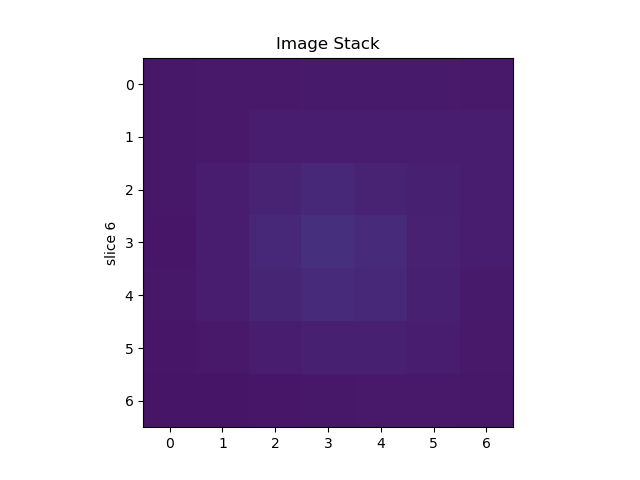

In [51]:
stkshow(Ave_Bead)

In [100]:
from scipy.spatial import KDTree
from scipy import optimize
def find_pair_error(tvect, beads1, beads2):
    #global naccepted, dists, naccepted2, residual
    beads2_reg = beads2+tvect
    tree = KDTree(beads1)
    b2_pair = [tree.query(p) for p in beads2_reg]
    dists, idx = zip(*b2_pair)
    b2_pair = [beads1[i] for i in idx]
    #list(zip(dists, beads2, b2_pair))
    naccepted, idx = reject_outliers(dists)
    for i in range(5):
        naccepted, idx = reject_outliers(naccepted)
#     if len(naccepted)/len(dists) < 0.8:
#         print('Warning lots of beads rejected')
    naccepted2, idx = reject_outliers(naccepted)
#     if len(naccepted2)/len(dists) < 0.8:
#         print('Warning lots of beads rejected')
    residual = np.abs(np.median(naccepted2))
    return residual
def reject_outliers(data, m=2):
    """
    Reject outliers for robust distance estimation.
    (Bead candidates could be incorrect or their cognate pair could be
    missing in the cognate hybe)
    """
    data = np.array(data)
    good_idx = abs(data - np.mean(data)) < m * np.std(data)
    return data[good_idx], good_idx

In [54]:
bead_pkl_savepth = '/data/Transverse_Second_2018Aug24/Avg_Bead_Test/beads.pkl'
folders = ['Avg_Bead_Test'] # list of seperate files of bead data
bead_dicts = defaultdict(dict)
for f in folders:
    npth = os.path.join(md_pth, f)
    filez = !find {npth} -type f
    for fi in filez:
        d = pickle.load(open(fi, 'rb'))
        d = {k.split('_')[0]:v for k, v in d.items()}
        bpth, pos = os.path.split(fi)
        bead_dicts[pos].update(d)
pickle.dump(bead_dicts, open(bead_pkl_savepth, 'wb'))

In [75]:
initial = (0,0,0)
bead_ref = bead_dicts['Pos0']['hybe1']
print(len(bead_ref), 'reference beads')
bead_dest = bead_dicts['Pos0']['hybe2']
print(len(bead_dest), 'destination beads')
tvect = optimize.fmin(find_pair_error, initial,args=(bead_ref, bead_dest), disp=True)
tvect

298 reference beads
283 destination beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
257 accpted beads
219 accpted beads
219 accpted beads
231 accpted beads
208 accpted beads
245 accpted beads
231 accpted beads
208 accpted beads
231 accpted beads
208 accpted beads
217 

array([-0.97098135, -3.49999099, -0.03882103])

In [101]:
initial = (0,0,0)
for pos in bead_dicts.keys():
    for hybe in bead_dicts[pos].keys():
        bead_ref = bead_dicts[pos][next(iter(bead_dicts[pos].keys()))]
        bead_dest = bead_dicts[pos][hybe]
        tvect = optimize.fmin(find_pair_error, initial,args=(bead_ref, bead_dest), disp=True)
        print(pos, len(bead_dicts[pos][next(iter(bead_dicts[pos].keys()))]),'beads in ref')
        print(pos, len(bead_dicts[pos][hybe]),'beads in test')        
        print(pos,hybe,tvect)

/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/numpy/core/_methods.py:135: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/numpy/core/_methods.py:105: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/numpy/core/_methods.py:127: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Optimization terminated successfully.
         Current function value: 0.000057
         Iterations: 12
         Function evaluations: 25
Pos18 230 beads in ref
Pos18 230 beads in test
Pos18 hybe1 [-2.25194330e-05 -4.65249200e-05 -2.33767718e-05]
Optimization terminated successfully.
         Current function value: 0.580533
         Iterations: 173
         Function evaluations: 318
Pos18 230 beads in ref
Pos18 219 beads in test
Pos18 hybe2 [ 2.87711435 -0.49998679 -0.26814931]
Optimization terminated successfully.
         Current function value: 0.902232
         Iterations: 126
         Function evaluations: 239
Pos18 230 beads in ref
Pos18 202 beads in test
Pos18 hybe3 [ 4.93774579 -1.1362064  -1.25299647]
Optimization terminated successfully.
         Current function value: 1.394142
         Iterations: 170
         Function evaluations: 328
Pos18 230 beads in ref
Pos18 208 beads in test
Pos18 hybe4 [ 5.49380862 -3.35649892 -1.79101121]
Optimization terminated successfully.
    

Optimization terminated successfully.
         Current function value: 4.563529
         Iterations: 75
         Function evaluations: 151
Pos82 102 beads in ref
Pos82 56 beads in test
Pos82 hybe9 [ 3.00606339 -5.44452129  1.66961926]
Optimization terminated successfully.
         Current function value: 0.000037
         Iterations: 11
         Function evaluations: 26
Pos17 294 beads in ref
Pos17 294 beads in test
Pos17 hybe1 [ 1.49272215e-05 -2.51390794e-05  2.19288218e-05]
Optimization terminated successfully.
         Current function value: 1.220837
         Iterations: 151
         Function evaluations: 294
Pos17 294 beads in ref
Pos17 265 beads in test
Pos17 hybe2 [ 2.21370104 -1.56674228 -0.82732337]
Optimization terminated successfully.
         Current function value: 1.542351
         Iterations: 73
         Function evaluations: 149
Pos17 294 beads in ref
Pos17 245 beads in test
Pos17 hybe3 [ 3.09263561 -4.07335879 -0.63516692]
Optimization terminated successfully.
       

Optimization terminated successfully.
         Current function value: 0.707404
         Iterations: 92
         Function evaluations: 173
Pos24 249 beads in ref
Pos24 202 beads in test
Pos24 hybe8 [ 4.49994707 -5.50000146 -1.01911724]
Optimization terminated successfully.
         Current function value: 0.500000
         Iterations: 293
         Function evaluations: 533
Pos24 249 beads in ref
Pos24 207 beads in test
Pos24 hybe9 [ 5.50000003 -4.99989177 -0.99996698]
Optimization terminated successfully.
         Current function value: 0.000057
         Iterations: 12
         Function evaluations: 25
Pos22 314 beads in ref
Pos22 314 beads in test
Pos22 hybe1 [-4.65249200e-05 -2.25194330e-05 -2.33767718e-05]
Optimization terminated successfully.
         Current function value: 0.429672
         Iterations: 142
         Function evaluations: 271
Pos22 314 beads in ref
Pos22 280 beads in test
Pos22 hybe2 [ 2.91320497 -0.26663478 -2.32556159]


KeyboardInterrupt: 

<IPython.core.display.Javascript object>


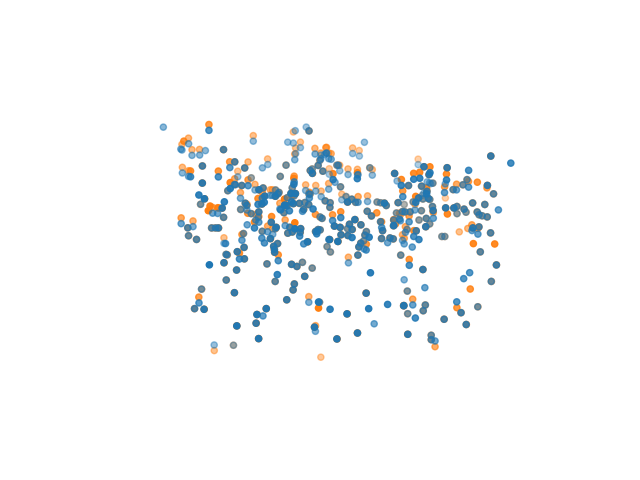

In [120]:
%matplotlib notebook
from mpl_toolkits.mplot3d import axes3d, Axes3D
Pos = 'Pos59'
fig = plt.figure()
#bead_dicts['Pos0']['hybe1']
ax = Axes3D(fig)
#for h in bead_dicts[Pos].keys():
#    X, Y, Z = bead_dicts[Pos][h][:,0], bead_dicts[Pos][h][:,1], bead_dicts[Pos][h][:,2]
#    cset = ax.scatter(X, Y, Z)
#    ax.clabel(cset, fontsize=9, inline=1)
A = bead_dicts[Pos]['hybe1']
X, Y, Z = A[:,0], A[:,1], A[:,2]
cset = ax.scatter(X, Y, Z)
ax.clabel(cset, fontsize=9, inline=1)
B = bead_dicts[Pos]['hybe2'] + [ 3.07579842, -0.28712367, -1]
X, Y, Z = B[:,0], B[:,1], B[:,2]
cset = ax.scatter(X, Y, Z)
ax.clabel(cset, fontsize=9, inline=1)

ax.grid(False)
plt.axis('off')
plt.show()

In [4]:
from metadata import *
image_path = '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Second_2018Aug24/'
md = Metadata(image_path)
md.image_table = md.image_table[[True if 'hybe' in i else False for i in md.image_table.acq]]
posnames = md.posnames
hybe_list = sorted([i.split('_')[0] for i in md.acqnames if 'hybe' in i])
fnames_dicts = [md.stkread(Channel='DeepBlue', Position=pos,
                   fnames_only=True, groupby='acq', 
                  hybe=hybe_list) for pos in posnames]

In [1]:
from metadata import *
image_path = '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Second_2018Aug24/'
md = Metadata(image_path)
md.image_table = md.image_table[[True if 'hybe' in i else False for i in md.image_table.acq]]
posnames = md.posnames
hybe_list = sorted([i.split('_')[0] for i in md.acqnames if 'hybe' in i])
from collections import defaultdict
stk_dict = defaultdict(dict)
for h in hybe_list:
    stk_dict[h] = md.stkread(Position = 'Pos0', Channel = 'DeepBlue', hybe = h)

opening img_Pos0_000000052_000000000_DeepBlue_000_052.tif

In [20]:
import imreg_dft as ird
ref_img = stk_dict['hybe1']
img = stk_dict['hybe2']
tform = defaultdict(dict)
for i in range(len(stk_dict['hybe1'].shape)):
    print(i)
    ref_img_max = ref_img.max(axis=i)
    img_max = img.max(axis=i)   
    tform[i] = ird.translation(ref_img_max, img_max)
    print(tform[i])

0
{'tvec': array([-3.58461837, -0.18899365]), 'success': 0.58944951950077, 'angle': 0}
1
{'tvec': array([ 0.07067696, -0.00856823]), 'success': 0.6714108844350233, 'angle': 0}
2
{'tvec': array([ 0.10091296, -3.31982266]), 'success': 0.45026831338551004, 'angle': 0}
0
{'tvec': array([-3.58461837, -0.18899365]), 'success': 0.58944951950077, 'angle': 0}
1
{'tvec': array([ 0.07067696, -0.00856823]), 'success': 0.6714108844350233, 'angle': 0}
2
{'tvec': array([ 0.10091296, -3.31982266]), 'success': 0.45026831338551004, 'angle': 0}
0
{'tvec': array([-3.58461837, -0.18899365]), 'success': 0.58944951950077, 'angle': 0}
1
{'tvec': array([ 0.07067696, -0.00856823]), 'success': 0.6714108844350233, 'angle': 0}
2
{'tvec': array([ 0.10091296, -3.31982266]), 'success': 0.45026831338551004, 'angle': 0}
0
{'tvec': array([-3.58461837, -0.18899365]), 'success': 0.58944951950077, 'angle': 0}
1
{'tvec': array([ 0.07067696, -0.00856823]), 'success': 0.6714108844350233, 'angle': 0}
2
{'tvec': array([ 0.10091

In [146]:
# run this when deconvolve codestacks is done
path = '/hybedata/Zach/FISH_Troubleshooting/Transverse_Second_2018Aug24/Analysis/codestacks/'
for pos in os.listdir(path):
    temp_path = os.path.join(path,pos)
    hdata = HybeData(temp_path)
    for z in hdata.metadata.zindex.unique():
        img = hdata.load_data(pos, z, 'cstk')
        hdata.add_and_save_data(np.swapaxes(np.swapaxes(img, 0, 2), 1, 2), pos, z, 'cstk')

Pos18 2 cstk
cstk_Pos18_z_2.tif
Warning rewriting over existing file.
Pos18 5 cstk
cstk_Pos18_z_5.tif
Warning rewriting over existing file.
Pos18 8 cstk
cstk_Pos18_z_8.tif
Warning rewriting over existing file.
Pos18 11 cstk
cstk_Pos18_z_11.tif
Warning rewriting over existing file.
Pos18 14 cstk
cstk_Pos18_z_14.tif
Warning rewriting over existing file.
Pos18 17 cstk
cstk_Pos18_z_17.tif
Warning rewriting over existing file.
Pos18 20 cstk
cstk_Pos18_z_20.tif
Warning rewriting over existing file.
Pos18 23 cstk
cstk_Pos18_z_23.tif
Warning rewriting over existing file.
Pos18 26 cstk
cstk_Pos18_z_26.tif
Warning rewriting over existing file.
Pos18 29 cstk
cstk_Pos18_z_29.tif
Warning rewriting over existing file.
Pos18 32 cstk
cstk_Pos18_z_32.tif
Warning rewriting over existing file.
Pos18 35 cstk
cstk_Pos18_z_35.tif
Warning rewriting over existing file.
Pos18 38 cstk
cstk_Pos18_z_38.tif
Warning rewriting over existing file.
Pos18 41 cstk
cstk_Pos18_z_41.tif
Warning rewriting over existing file

Warning rewriting over existing file.
Pos28 32 cstk
cstk_Pos28_z_32.tif
Warning rewriting over existing file.
Pos28 35 cstk
cstk_Pos28_z_35.tif
Warning rewriting over existing file.
Pos28 38 cstk
cstk_Pos28_z_38.tif
Warning rewriting over existing file.
Pos28 41 cstk
cstk_Pos28_z_41.tif
Warning rewriting over existing file.
Pos28 44 cstk
cstk_Pos28_z_44.tif
Warning rewriting over existing file.
Pos24 2 cstk
cstk_Pos24_z_2.tif
Warning rewriting over existing file.
Pos24 5 cstk
cstk_Pos24_z_5.tif
Warning rewriting over existing file.
Pos24 8 cstk
cstk_Pos24_z_8.tif
Warning rewriting over existing file.
Pos24 11 cstk
cstk_Pos24_z_11.tif
Warning rewriting over existing file.
Pos24 14 cstk
cstk_Pos24_z_14.tif
Warning rewriting over existing file.
Pos24 17 cstk
cstk_Pos24_z_17.tif
Warning rewriting over existing file.
Pos24 20 cstk
cstk_Pos24_z_20.tif
Warning rewriting over existing file.
Pos24 23 cstk
cstk_Pos24_z_23.tif
Warning rewriting over existing file.
Pos24 26 cstk
cstk_Pos24_z_26.ti

Warning rewriting over existing file.
Pos21 17 cstk
cstk_Pos21_z_17.tif
Warning rewriting over existing file.
Pos21 20 cstk
cstk_Pos21_z_20.tif
Warning rewriting over existing file.
Pos21 23 cstk
cstk_Pos21_z_23.tif
Warning rewriting over existing file.
Pos21 26 cstk
cstk_Pos21_z_26.tif
Warning rewriting over existing file.
Pos21 29 cstk
cstk_Pos21_z_29.tif
Warning rewriting over existing file.
Pos21 32 cstk
cstk_Pos21_z_32.tif
Warning rewriting over existing file.
Pos21 35 cstk
cstk_Pos21_z_35.tif
Warning rewriting over existing file.
Pos21 38 cstk
cstk_Pos21_z_38.tif
Warning rewriting over existing file.
Pos21 41 cstk
cstk_Pos21_z_41.tif
Warning rewriting over existing file.
Pos21 44 cstk
cstk_Pos21_z_44.tif
Warning rewriting over existing file.
Pos32 2 cstk
cstk_Pos32_z_2.tif
Warning rewriting over existing file.
Pos32 5 cstk
cstk_Pos32_z_5.tif
Warning rewriting over existing file.
Pos32 8 cstk
cstk_Pos32_z_8.tif
Warning rewriting over existing file.
Pos32 11 cstk
cstk_Pos32_z_11.ti

Pos37 44 cstk
cstk_Pos37_z_44.tif
Warning rewriting over existing file.
Pos5 2 cstk
cstk_Pos5_z_2.tif
Warning rewriting over existing file.
Pos5 5 cstk
cstk_Pos5_z_5.tif
Warning rewriting over existing file.
Pos5 8 cstk
cstk_Pos5_z_8.tif
Warning rewriting over existing file.
Pos5 11 cstk
cstk_Pos5_z_11.tif
Warning rewriting over existing file.
Pos5 14 cstk
cstk_Pos5_z_14.tif
Warning rewriting over existing file.
Pos5 17 cstk
cstk_Pos5_z_17.tif
Warning rewriting over existing file.
Pos5 20 cstk
cstk_Pos5_z_20.tif
Warning rewriting over existing file.
Pos5 23 cstk
cstk_Pos5_z_23.tif
Warning rewriting over existing file.
Pos5 26 cstk
cstk_Pos5_z_26.tif
Warning rewriting over existing file.
Pos5 29 cstk
cstk_Pos5_z_29.tif
Warning rewriting over existing file.
Pos5 32 cstk
cstk_Pos5_z_32.tif
Warning rewriting over existing file.
Pos5 35 cstk
cstk_Pos5_z_35.tif
Warning rewriting over existing file.
Pos5 38 cstk
cstk_Pos5_z_38.tif
Warning rewriting over existing file.
Pos5 41 cstk
cstk_Pos5_z

Pos54 29 cstk
cstk_Pos54_z_29.tif
Warning rewriting over existing file.
Pos54 32 cstk
cstk_Pos54_z_32.tif
Warning rewriting over existing file.
Pos54 35 cstk
cstk_Pos54_z_35.tif
Warning rewriting over existing file.
Pos54 38 cstk
cstk_Pos54_z_38.tif
Warning rewriting over existing file.
Pos54 41 cstk
cstk_Pos54_z_41.tif
Warning rewriting over existing file.
Pos54 44 cstk
cstk_Pos54_z_44.tif
Warning rewriting over existing file.
Pos40 2 cstk
cstk_Pos40_z_2.tif
Warning rewriting over existing file.
Pos40 5 cstk
cstk_Pos40_z_5.tif
Warning rewriting over existing file.
Pos40 8 cstk
cstk_Pos40_z_8.tif
Warning rewriting over existing file.
Pos40 11 cstk
cstk_Pos40_z_11.tif
Warning rewriting over existing file.
Pos40 14 cstk
cstk_Pos40_z_14.tif
Warning rewriting over existing file.
Pos40 17 cstk
cstk_Pos40_z_17.tif
Warning rewriting over existing file.
Pos40 20 cstk
cstk_Pos40_z_20.tif
Warning rewriting over existing file.
Pos40 23 cstk
cstk_Pos40_z_23.tif
Warning rewriting over existing file

Pos19 14 cstk
cstk_Pos19_z_14.tif
Warning rewriting over existing file.
Pos19 17 cstk
cstk_Pos19_z_17.tif
Warning rewriting over existing file.
Pos19 20 cstk
cstk_Pos19_z_20.tif
Warning rewriting over existing file.
Pos19 23 cstk
cstk_Pos19_z_23.tif
Warning rewriting over existing file.
Pos19 26 cstk
cstk_Pos19_z_26.tif
Warning rewriting over existing file.
Pos19 29 cstk
cstk_Pos19_z_29.tif
Warning rewriting over existing file.
Pos19 32 cstk
cstk_Pos19_z_32.tif
Warning rewriting over existing file.
Pos19 35 cstk
cstk_Pos19_z_35.tif
Warning rewriting over existing file.
Pos19 38 cstk
cstk_Pos19_z_38.tif
Warning rewriting over existing file.
Pos19 41 cstk
cstk_Pos19_z_41.tif
Warning rewriting over existing file.
Pos19 44 cstk
cstk_Pos19_z_44.tif
Warning rewriting over existing file.
Pos77 2 cstk
cstk_Pos77_z_2.tif
Warning rewriting over existing file.
Pos77 5 cstk
cstk_Pos77_z_5.tif
Warning rewriting over existing file.
Pos77 8 cstk
cstk_Pos77_z_8.tif
Warning rewriting over existing file

Warning rewriting over existing file.
Pos27 44 cstk
cstk_Pos27_z_44.tif
Warning rewriting over existing file.
Pos73 2 cstk
cstk_Pos73_z_2.tif
Warning rewriting over existing file.
Pos73 5 cstk
cstk_Pos73_z_5.tif
Warning rewriting over existing file.
Pos73 8 cstk
cstk_Pos73_z_8.tif
Warning rewriting over existing file.
Pos73 11 cstk
cstk_Pos73_z_11.tif
Warning rewriting over existing file.
Pos73 14 cstk
cstk_Pos73_z_14.tif
Warning rewriting over existing file.
Pos73 17 cstk
cstk_Pos73_z_17.tif
Warning rewriting over existing file.
Pos73 20 cstk
cstk_Pos73_z_20.tif
Warning rewriting over existing file.
Pos73 23 cstk
cstk_Pos73_z_23.tif
Warning rewriting over existing file.
Pos73 26 cstk
cstk_Pos73_z_26.tif
Warning rewriting over existing file.
Pos73 29 cstk
cstk_Pos73_z_29.tif
Warning rewriting over existing file.
Pos73 32 cstk
cstk_Pos73_z_32.tif
Warning rewriting over existing file.
Pos73 35 cstk
cstk_Pos73_z_35.tif
Warning rewriting over existing file.
Pos73 38 cstk
cstk_Pos73_z_38.ti

Pos33 29 cstk
cstk_Pos33_z_29.tif
Warning rewriting over existing file.
Pos33 32 cstk
cstk_Pos33_z_32.tif
Warning rewriting over existing file.
Pos33 35 cstk
cstk_Pos33_z_35.tif
Warning rewriting over existing file.
Pos33 38 cstk
cstk_Pos33_z_38.tif
Warning rewriting over existing file.
Pos33 41 cstk
cstk_Pos33_z_41.tif
Warning rewriting over existing file.
Pos33 44 cstk
cstk_Pos33_z_44.tif
Warning rewriting over existing file.
Pos68 2 cstk
cstk_Pos68_z_2.tif
Warning rewriting over existing file.
Pos68 5 cstk
cstk_Pos68_z_5.tif
Warning rewriting over existing file.
Pos68 8 cstk
cstk_Pos68_z_8.tif
Warning rewriting over existing file.
Pos68 11 cstk
cstk_Pos68_z_11.tif
Warning rewriting over existing file.
Pos68 14 cstk
cstk_Pos68_z_14.tif
Warning rewriting over existing file.
Pos68 17 cstk
cstk_Pos68_z_17.tif
Warning rewriting over existing file.
Pos68 20 cstk
cstk_Pos68_z_20.tif
Warning rewriting over existing file.
Pos68 23 cstk
cstk_Pos68_z_23.tif
Warning rewriting over existing file

Pos3 14 cstk
cstk_Pos3_z_14.tif
Warning rewriting over existing file.
Pos3 17 cstk
cstk_Pos3_z_17.tif
Warning rewriting over existing file.
Pos3 20 cstk
cstk_Pos3_z_20.tif
Warning rewriting over existing file.
Pos3 23 cstk
cstk_Pos3_z_23.tif
Warning rewriting over existing file.
Pos3 26 cstk
cstk_Pos3_z_26.tif
Warning rewriting over existing file.
Pos3 29 cstk
cstk_Pos3_z_29.tif
Warning rewriting over existing file.
Pos3 32 cstk
cstk_Pos3_z_32.tif
Warning rewriting over existing file.
Pos3 35 cstk
cstk_Pos3_z_35.tif
Warning rewriting over existing file.
Pos3 38 cstk
cstk_Pos3_z_38.tif
Warning rewriting over existing file.
Pos3 41 cstk
cstk_Pos3_z_41.tif
Warning rewriting over existing file.
Pos3 44 cstk
cstk_Pos3_z_44.tif
Warning rewriting over existing file.
Pos39 2 cstk
cstk_Pos39_z_2.tif
Warning rewriting over existing file.
Pos39 5 cstk
cstk_Pos39_z_5.tif
Warning rewriting over existing file.
Pos39 8 cstk
cstk_Pos39_z_8.tif
Warning rewriting over existing file.
Pos39 11 cstk
cstk_P

Warning rewriting over existing file.
Pos61 2 cstk
cstk_Pos61_z_2.tif
Warning rewriting over existing file.
Pos61 5 cstk
cstk_Pos61_z_5.tif
Warning rewriting over existing file.
Pos61 8 cstk
cstk_Pos61_z_8.tif
Warning rewriting over existing file.
Pos61 11 cstk
cstk_Pos61_z_11.tif
Warning rewriting over existing file.
Pos61 14 cstk
cstk_Pos61_z_14.tif
Warning rewriting over existing file.
Pos61 17 cstk
cstk_Pos61_z_17.tif
Warning rewriting over existing file.
Pos61 20 cstk
cstk_Pos61_z_20.tif
Warning rewriting over existing file.
Pos61 23 cstk
cstk_Pos61_z_23.tif
Warning rewriting over existing file.
Pos61 26 cstk
cstk_Pos61_z_26.tif
Warning rewriting over existing file.
Pos61 29 cstk
cstk_Pos61_z_29.tif
Warning rewriting over existing file.
Pos61 32 cstk
cstk_Pos61_z_32.tif
Warning rewriting over existing file.
Pos61 35 cstk
cstk_Pos61_z_35.tif
Warning rewriting over existing file.
Pos61 38 cstk
cstk_Pos61_z_38.tif
Warning rewriting over existing file.
Pos61 41 cstk
cstk_Pos61_z_41.ti

Pos55 29 cstk
cstk_Pos55_z_29.tif
Warning rewriting over existing file.
Pos55 32 cstk
cstk_Pos55_z_32.tif
Warning rewriting over existing file.
Pos55 35 cstk
cstk_Pos55_z_35.tif
Warning rewriting over existing file.
Pos55 38 cstk
cstk_Pos55_z_38.tif
Warning rewriting over existing file.
Pos55 41 cstk
cstk_Pos55_z_41.tif
Warning rewriting over existing file.
Pos55 44 cstk
cstk_Pos55_z_44.tif
Warning rewriting over existing file.
Pos0 2 cstk
cstk_Pos0_z_2.tif
Warning rewriting over existing file.
Pos0 5 cstk
cstk_Pos0_z_5.tif
Warning rewriting over existing file.
Pos0 8 cstk
cstk_Pos0_z_8.tif
Warning rewriting over existing file.
Pos0 11 cstk
cstk_Pos0_z_11.tif
Warning rewriting over existing file.
Pos0 14 cstk
cstk_Pos0_z_14.tif
Warning rewriting over existing file.
Pos0 17 cstk
cstk_Pos0_z_17.tif
Warning rewriting over existing file.
Pos0 20 cstk
cstk_Pos0_z_20.tif
Warning rewriting over existing file.
Pos0 23 cstk
cstk_Pos0_z_23.tif
Warning rewriting over existing file.
Pos0 26 cstk
c

Pos13 17 cstk
cstk_Pos13_z_17.tif
Warning rewriting over existing file.
Pos13 20 cstk
cstk_Pos13_z_20.tif
Warning rewriting over existing file.
Pos13 23 cstk
cstk_Pos13_z_23.tif
Warning rewriting over existing file.
Pos13 26 cstk
cstk_Pos13_z_26.tif
Warning rewriting over existing file.
Pos13 29 cstk
cstk_Pos13_z_29.tif
Warning rewriting over existing file.
Pos13 32 cstk
cstk_Pos13_z_32.tif
Warning rewriting over existing file.
Pos13 35 cstk
cstk_Pos13_z_35.tif
Warning rewriting over existing file.
Pos13 38 cstk
cstk_Pos13_z_38.tif
Warning rewriting over existing file.
Pos13 41 cstk
cstk_Pos13_z_41.tif
Warning rewriting over existing file.
Pos13 44 cstk
cstk_Pos13_z_44.tif
Warning rewriting over existing file.


In [221]:
from metadata import *
import pickle
def fetch_substacks(stk, peaks, w=2, sz = 1):
    imsz = stk.shape
    substks = {}
    for p in peaks:
        if (p[0] <= w) or (p[0] >= imsz[0]-w):
            continue
        if (p[1] <= w) or (p[1] >= imsz[1]-w):
            continue
        if (p[2] <= w) or (p[2] >= imsz[2]-w):
            continue
        substk = stk[p[0]:p[0]+2*sz-1, p[1]:p[1]+2*sz-1, p[2]-sz:p[2]+sz-1]
        substks[tuple(p)] = substk
    return substks

In [ ]:
path = '/mnt/HypeScope/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/hybe1_3'
md = Metadata(path)
stk = md.stkread(Channel='DeepBlue',Position='Pos0', hybe='hybe1')
beads = pickle.load(open('/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/results/beads.pkl','rb'))
peaks = beads['Pos0']['hybe1']
substacks = fetch_substacks(stk,peaks,w = 2, sz = 3)

In [169]:
bead_list = []
for bead in substacks.keys():
    bead_list.append(bead)

(2031, 809, 38)
(7, 7, 7)


<IPython.core.display.Javascript object>


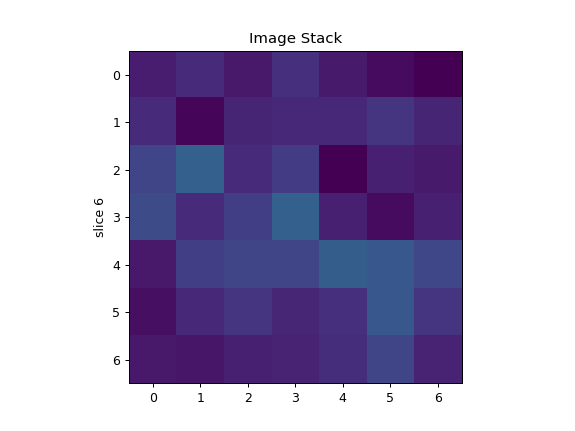

In [222]:
substacks = fetch_substacks(stk,peaks, sz = 4)
bead = bead_list[3]
test_bead = substacks[bead]
print(bead)
print(test_bead.shape)
stkshow(test_bead)

In [402]:
import sys
def sizeof_fmt(num, suffix='B'):
    ''' By Fred Cirera, after https://stackoverflow.com/a/1094933/1870254'''
    for unit in ['','Ki','Mi','Gi','Ti','Pi','Ei','Zi']:
        if abs(num) < 1024.0:
            return "%3.1f%s%s" % (num, unit, suffix)
        num /= 1024.0
    return "%.1f%s%s" % (num, 'Yi', suffix)

for name, size in sorted(((name, sys.getsizeof(value)) for name,value in locals().items()),
                         key= lambda x: -x[1]):
    print("{:>30}: {:>8}".format(name,sizeof_fmt(size)))

                           ___:   2.5GiB
                      norm_stk:   2.5GiB
                      temp_stk:   2.5GiB
                          _387:   2.5GiB
                          _388:   2.5GiB
                    thresh_stk:  32.0MiB
                          _334:  13.4MiB
                          _337:  13.4MiB
                          _338:   7.4MiB
                          _146:   1.4MiB
                          _353:  22.4KiB
                          _356:  22.4KiB
                          _384:  22.4KiB
                     substacks:  18.1KiB
                           _14:  18.1KiB
                     xshift_fr:  16.1KiB
                     yshift_fr:  16.1KiB
                      xshift_g:  16.1KiB
                      yshift_g:  16.1KiB
                     xshift_db:  16.1KiB
                     yshift_db:  16.1KiB
                          _357:  15.0KiB
                          _148:  14.8KiB
                          _152:  14.8KiB
                

In [2]:
import datetime
from metadata import *
import trackpy
print('Starting',datetime.datetime.now())
path = '/mnt/HypeScope/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/'
md = Metadata(path)
test_beads = {}
hybe_list = ['hybe1', 'hybe2', 'hybe3', 'hybe4', 'hybe5', 'hybe6', 'hybe7', 'hybe8', 'hybe9']
for hybe in hybe_list:
    print('\n', hybe,datetime.datetime.now())
    temp_stk = md.stkread(Channel='DeepBlue',Position='Pos0', hybe=hybe)
    temp_stk = temp_stk/temp_stk.max()
    test_beads[hybe] = trackpy.locate(temp_stk,7,percentile=95, characterize=False)
print('\n','Finished',datetime.datetime.now())

Starting 2018-09-20 16:53:10.088505

 hybe1 2018-09-20 16:53:14.797682
opening img_Pos0_000000081_000000000_DeepBlue_000_081.tif
 hybe2 2018-09-20 16:55:31.244177
opening img_Pos0_000000081_000000000_DeepBlue_000_081.tif
 hybe3 2018-09-20 16:57:45.398929
opening img_Pos0_000000081_000000000_DeepBlue_000_081.tif
 hybe4 2018-09-20 16:59:55.915284
opening img_Pos0_000000081_000000000_DeepBlue_000_081.tif
 hybe5 2018-09-20 17:02:04.756350
opening img_Pos0_000000081_000000000_DeepBlue_000_081.tif
 hybe6 2018-09-20 17:04:11.797026
opening img_Pos0_000000081_000000000_DeepBlue_000_081.tif
 hybe7 2018-09-20 17:06:20.663725
opening img_Pos0_000000081_000000000_DeepBlue_000_081.tif
 hybe8 2018-09-20 17:08:27.429916
opening img_Pos0_000000081_000000000_DeepBlue_000_081.tif
 hybe9 2018-09-20 17:10:35.859472
opening img_Pos0_000000081_000000000_DeepBlue_000_081.tifFinished 2018-09-20 17:12:45.623455


In [31]:
A = datetime.datetime.now()

In [32]:
B = datetime.datetime.now()

In [33]:
A -B

datetime.timedelta(-1, 86394, 73828)

In [2]:
import datetime
from metadata import *
import trackpy
from functools import partial
import multiprocessing 
print('\n','Starting',datetime.datetime.now())
hybe_list = ['hybe1', 'hybe2', 'hybe3', 'hybe4', 'hybe5', 'hybe6', 'hybe7', 'hybe8', 'hybe9']
path = '/mnt/HypeScope/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/'
md = Metadata(path)
posnames = md.posnames
posnames = [pos for pos in posnames if "Pos" in pos]
def new_find_beads(md,pos):
    start = datetime.datetime.now()
    test_beads = {}
    for hybe in hybe_list:
        temp_stk = md.stkread(Channel='DeepBlue',Position=pos, hybe=hybe)
        temp_stk = temp_stk/temp_stk.max()
        bead_df = trackpy.locate(temp_stk,7,percentile=95, characterize=False)
        test_beads[hybe] = bead_df#.as_matrix[:,0:3]
    end = datetime.datetime.now()
    print('\n','Started',pos,'at',start)
    print('\n','Ended',pos,'at',end)
    return test_beads,pos
started = datetime.datetime.now()
pfunc = partial(new_find_beads,md)
full_test_beads = {}
pfunc = partial(new_find_beads,md)
ncpu = 12
with multiprocessing.Pool(ncpu) as p:
    for result,pos in p.imap(pfunc,posnames):
        full_test_beads[pos] = result
ended = datetime.datetime.now()
print('\n','Started at',started)
print('\n','Ended at',ended)
print('\n','Total of', len(posnames),'positions completed')


 Starting 2018-09-20 21:44:04.917147
opening img_Pos8_000000081_000000000_DeepBlue_000_081.tiff
 Started Pos2 at 2018-09-20 21:44:16.519679

 Ended Pos2 at 2018-09-20 22:08:46.063096
opening img_Pos10_000000081_000000000_DeepBlue_000_081.tif
 Started Pos1 at 2018-09-20 21:44:14.267493

 Ended Pos1 at 2018-09-20 22:09:19.234964
opening img_Pos6_000000081_000000000_DeepBlue_000_081.tiff
 Started Pos0 at 2018-09-20 21:44:12.025849

 Ended Pos0 at 2018-09-20 22:09:46.507101
opening img_Pos14_000000081_000000000_DeepBlue_000_081.tif
 Started Pos3 at 2018-09-20 21:44:19.006520

 Ended Pos3 at 2018-09-20 22:10:05.524589
opening img_Pos15_000000081_000000000_DeepBlue_000_081.tif
 Started Pos9 at 2018-09-20 21:44:32.928422

 Ended Pos9 at 2018-09-20 22:10:33.522256
opening img_Pos16_000000023_000000000_DeepBlue_000_023.tif
 Started Pos11 at 2018-09-20 21:44:37.303786

 Ended Pos11 at 2018-09-20 22:10:37.539372
opening img_Pos17_000000081_000000000_DeepBlue_000_081.tif
 Started Pos5 at 2018-09-

In [123]:
import pickle
test_beads = pickle.load(open('/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/results/beads_test.pkl','rb'))


In [125]:
test_beads

{'Pos0': {'hybe1': array([[  22.92987013,  189.88163265,   64.96029685],
         [  28.86467391,  709.275     ,   75.15271739],
         [  39.94388426,  316.96405085,    7.75317843],
         [  45.27161612, 1201.29108194,    6.84925306],
         [  68.77013963, 1053.65950591,    6.98388829],
         [  74.93164408, 1802.85562758,    6.77961108],
         [  80.14933444, 1061.99084859,   10.76039933],
         [  89.72970918, 1110.86200342,    7.14540962],
         [ 112.33597561,  535.75609756,    7.20304878],
         [ 147.16959841, 1662.30202456,    6.87122469],
         [ 153.79681937, 1276.3026347 ,    6.88108236],
         [ 167.1155914 , 1583.88239247,    6.46370968],
         [ 179.73690205,  527.15261959,   75.91059226],
         [ 231.28939052,  900.19142212,    6.74717833],
         [ 255.77031802, 1278.60989399,    6.40848057],
         [ 268.89487262,  154.97484682,    7.28506933],
         [ 272.75458079,  489.21321488,   73.1049417 ],
         [ 285.23744557, 1487.8

In [150]:
beads = pickle.load(open('/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/results/beads.pkl','rb'))
for pos,hybe_dict in test_beads.items():
    for hybe,temp in hybe_dict.items():
        old_median = np.median(beads[pos][hybe],axis=0)
        new_median = np.median(temp,axis=0)
        print('new',new_median)
        print('old',old_median)
    break

new [1045.74062969  862.1871118     6.79268293]
old [ 956. 1101.   13.]
new [1001.87425184  895.69680747    5.95038162]
old [ 964. 1121.    6.]
new [1067.76807607  843.76676558    7.02685192]
old [ 949. 1103.    7.]
new [1071.21174505  686.74727453    6.97236287]
old [1021. 1121.   19.]
new [1065.70608108  884.23124043    6.34111187]
old [ 953.5 1149.5    7. ]
new [1061.90086623  860.67768135    7.77389609]
old [ 937. 1149.    7.]
new [1059.90179095 1008.82377068    7.48159725]
old [1008.5 1115.     6. ]
new [1086.7445293   676.01776647    7.8610164 ]
old [1002.  1087.5    7.5]
new [1085.18729153  970.06125921    8.02710362]
old [ 938.5 1164.5    7. ]


In [147]:
beads

array([[  22.92987013,  189.88163265,   64.96029685],
       [  28.86467391,  709.275     ,   75.15271739],
       [  39.94388426,  316.96405085,    7.75317843],
       [  45.27161612, 1201.29108194,    6.84925306],
       [  68.77013963, 1053.65950591,    6.98388829],
       [  74.93164408, 1802.85562758,    6.77961108],
       [  80.14933444, 1061.99084859,   10.76039933],
       [  89.72970918, 1110.86200342,    7.14540962],
       [ 112.33597561,  535.75609756,    7.20304878],
       [ 147.16959841, 1662.30202456,    6.87122469],
       [ 153.79681937, 1276.3026347 ,    6.88108236],
       [ 167.1155914 , 1583.88239247,    6.46370968],
       [ 179.73690205,  527.15261959,   75.91059226],
       [ 231.28939052,  900.19142212,    6.74717833],
       [ 255.77031802, 1278.60989399,    6.40848057],
       [ 268.89487262,  154.97484682,    7.28506933],
       [ 272.75458079,  489.21321488,   73.1049417 ],
       [ 285.23744557, 1487.84702467,    6.74978229],
       [ 297.98108968,  560.

<IPython.core.display.Javascript object>


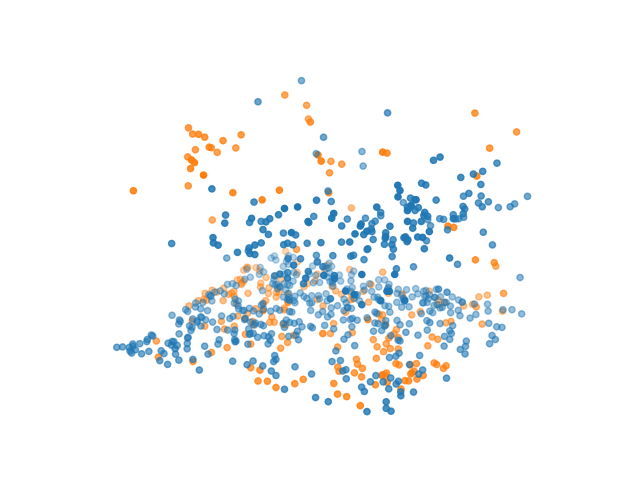

In [159]:
%matplotlib notebook
import pickle
beads = pickle.load(open('/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/results/beads.pkl','rb'))
tforms = pickle.load(open('/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/results/tforms.pkl','rb'))
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d, Axes3D
fig = plt.figure()
ax = Axes3D(fig)
dictionary2 = beads['Pos15']
for h in dictionary2.keys():
    if h == 'hybe1':
        X, Y, Z = dictionary2[h][:,0], dictionary2[h][:,1], dictionary2[h][:,2]
        cset = ax.scatter(X, Y, Z,)
        ax.clabel(cset, fontsize=9, inline=1)
dictionary2 = test_beads['Pos15']
for h in dictionary2.keys():
    if h == 'hybe1':
        X, Y, Z = dictionary2[h][:,1], dictionary2[h][:,0], dictionary2[h][:,2]
        cset = ax.scatter(X, Y, Z)
        ax.clabel(cset, fontsize=9, inline=1)
ax.grid(False)
plt.axis('off')
plt.show()

<IPython.core.display.Javascript object>


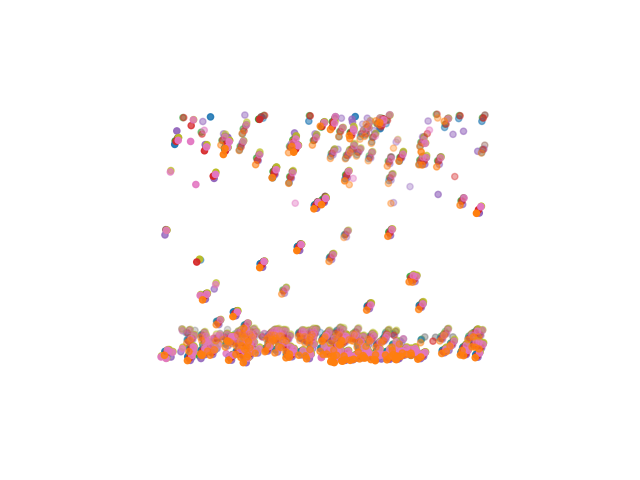

In [157]:
%matplotlib notebook
fig = plt.figure()
ax = Axes3D(fig)
dictionary2= test_beads['Pos15']
for h in dictionary2.keys():
    X, Y, Z = dictionary2[h][:,0], dictionary2[h][:,1], dictionary2[h][:,2]
    cset = ax.scatter(X, Y, Z)
    ax.clabel(cset, fontsize=9, inline=1)
ax.grid(False)
plt.axis('off')
plt.show()

In [136]:
Z

array([ 7,  5, 43, 70, 15, 75, 63, 38, 74,  6, 39,  5, 71, 57, 53, 58, 63,
       57, 71,  5,  5,  5, 72, 51,  5, 63, 67,  5, 71, 71,  6, 18, 61, 70,
        6, 76, 65, 73, 54,  6, 54, 73, 53,  6,  5, 64, 75,  5,  7, 53, 51,
       66,  5, 47,  6,  6, 63,  5,  4, 74,  5,  4, 47, 76, 35,  5,  5, 52,
       45, 60, 63, 64,  5,  5, 64,  5,  6, 69, 71, 76, 63, 39,  5, 73, 63,
        6,  5, 31,  5,  6, 76, 45, 53,  5,  5,  5,  6, 63,  5, 65,  6,  6,
       52, 73, 70, 66,  6,  5, 44, 69, 55,  6,  5,  5, 69, 65, 26,  5,  6,
       69, 53, 75, 71,  5, 64, 57, 36, 41, 65, 69, 59,  5, 71, 61, 57, 54,
       73, 68,  5, 48,  5, 70,  5, 40, 39, 50,  5,  5, 71, 70,  8, 72,  5,
       59, 58,  5, 67,  5,  5, 56,  5, 37,  5,  5, 35, 58,  6,  5, 52, 66,
        6,  7, 56, 76, 63, 57, 53,  7, 71, 65,  5, 67, 45, 72,  7,  5, 60,
        7, 54, 40, 61,  5, 53, 45,  5, 45, 54,  8,  5, 70,  6, 76, 55, 62,
        5,  6, 59,  6, 64,  5, 59,  7,  5,  5,  5, 35,  5, 53,  5, 41,  5,
       50,  7, 63, 21, 57

<IPython.core.display.Javascript object>


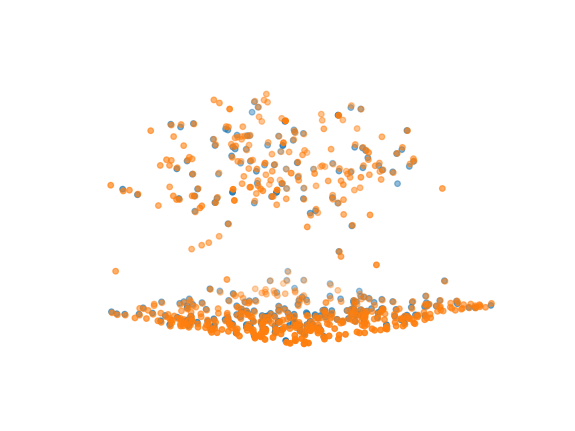

In [41]:
%matplotlib notebook
import pickle
beads = pickle.load(open('/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/results/beads.pkl','rb'))
tforms = pickle.load(open('/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/results/tforms.pkl','rb'))
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d, Axes3D
fig = plt.figure()
ax = Axes3D(fig)
pos = 'Pos15'
dictionary = full_test_beads[pos]
hybe = 'hybe1'
for h in dictionary.keys():
    if h == hybe:
        X, Y, Z = dictionary[h]['z'], dictionary[h]['y'], dictionary[h]['x']
        cset = ax.scatter(X, Y, Z)
        ax.clabel(cset, fontsize=9, inline=1)
dictionary2 = beads[pos]    
for h in dictionary2.keys():
    if h == hybe:
        X, Y, Z = dictionary2[h][:,0], dictionary2[h][:,1], dictionary2[h][:,2]
        cset = ax.scatter(X, Y, Z)
        ax.clabel(cset, fontsize=9, inline=1)
ax.grid(False)
plt.axis('off')
plt.show()

In [39]:
 dictionary[h]

,z,y,x,mass
0,21.882767,913.952594,5.379244,1.819581
1,42.004960,1721.823931,5.473652,1.880195
2,53.718227,179.086839,6.042515,2.577255
5,87.730667,620.961333,5.582000,1.748477
6,92.889278,261.073085,7.071335,2.663513
7,93.807165,866.937638,5.425918,2.635537
8,147.285488,1990.746174,5.226913,2.208909
9,156.297297,723.723938,5.315315,1.811422
10,164.209642,752.888995,5.430701,3.675298
11,184.314563,612.236893,5.297735,1.800931


In [5]:
bead_dict = {}
hybe_dict = {}
bead_list = []
for p in full_test_beads.keys():
    for h in full_test_beads[p].keys():
        hybe_dict[h] = full_test_beads[p][h].values[:,0:3] 
    bead_dict[p] = hybe_dict

In [42]:
bead_dict['Pos15']['hybe1']

array([[  22.92987013,  189.88163265,   64.96029685],
       [  28.86467391,  709.275     ,   75.15271739],
       [  39.94388426,  316.96405085,    7.75317843],
       [  45.27161612, 1201.29108194,    6.84925306],
       [  68.77013963, 1053.65950591,    6.98388829],
       [  74.93164408, 1802.85562758,    6.77961108],
       [  80.14933444, 1061.99084859,   10.76039933],
       [  89.72970918, 1110.86200342,    7.14540962],
       [ 112.33597561,  535.75609756,    7.20304878],
       [ 147.16959841, 1662.30202456,    6.87122469],
       [ 153.79681937, 1276.3026347 ,    6.88108236],
       [ 167.1155914 , 1583.88239247,    6.46370968],
       [ 179.73690205,  527.15261959,   75.91059226],
       [ 231.28939052,  900.19142212,    6.74717833],
       [ 255.77031802, 1278.60989399,    6.40848057],
       [ 268.89487262,  154.97484682,    7.28506933],
       [ 272.75458079,  489.21321488,   73.1049417 ],
       [ 285.23744557, 1487.84702467,    6.74978229],
       [ 297.98108968,  560.

In [8]:
pickle.dump(bead_dict,open('/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/results/beads_test.pkl','wb'))

In [43]:
#!python {analysis_file} {bead_path} {out_path} #Find Tforms
!python '/home/zach/Documents/PySpots/analysis_scripts/find_tforms.py' '/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/results/beads.pkl' '/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/results/old_tforms.pkl'

Namespace(bead_path='/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/results/beads.pkl', max_thresh=1.5, ncpu=4, out_path='/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/results/old_tforms.pkl')
0
0.40644491739783106
0.51334911507287
0.2191185300187173
0.29579768420418007
0.2519115652186451
0.3916962171174133
0.3431787042932615
0.4487461278167438
Pos0 all good
0
0.427412360557302
0.3486502910136715
0.2662584027357551
0.4016279742235463
0.3796922187016437
0.41678027227561676
0.4072899142790142
0.4498035471164467
Pos1 all good
0
0.2816388318757224
0.3716603123230558
0.42669342463534515
0.30947813490044374
0.4116416444977352
0.4042571937097718
0.4413892606298639
0.38412529011011026
Pos2 all good
0
0.38551010778711925
0.3461730278981426
0.4417530111878864
0.2601214326903644
0.45196185077109263
0.33328954826906365
0.33123169984436357
0.3421279530666141
Pos3 all good
0
0.3546999255809073
0.4149932952841422
0.3940998253827322
0.38327614869247034
0.25

0
0.33433920427315333
0.3650067538954291
0.38537402266755405
0.27295707338327424
0.27437667379427516
0.2796248420373717
0.2999838170030914
0.26920082744532103
Pos34 all good
0
0.38071373005720377
0.39197465534704523
0.3905407457407186
0.9883559787063508
0.3708461507506091
0.38827141395847137
0.4193142001943044
0.4075778697716832
Pos33 all good
0
0.48783453826770673
0.3051957463801714
0.37533964791651164
0.5128774086663977
0.3900819089114939
0.46079061539849325
0.4161693454899777
0.5034644764581288
Pos32 all good
0
0.49823454422341285
0.3997577248827655
0.4282282268405615
0.4503398074106478
0.4810754204007432
0.5701339118311176
0.4426475023965716
0.6007247903419461
Pos31 all good
0
0.5538946225931624
0.3190295746451783
0.4123167997571656
0.4405904041077259
0.5068599810573204
0.5220921253955089
0.5045969932654208
0.6009978217162104
Pos30 all good
0
0.3239014006346237
0.41565976382501646
0.4688069706788485
0.5779531355179582
0.45667299686130586
0.5194286283969505
0.5447539989039878
0.5422

In [45]:
def tform_image(cstk, channel, tvect, niter=25):
    """
    Warp images to correct chromatic abberation and translational stage drift.

    Parameters
    ----------
    cstk : ndarray
       Image(s) to be warped
    channel : str
       Name of channel (used to determine which chromatic warping to apply)
    tvect : tuple
       Tuple of floats to correct for stage drift

    Returns
    -------
    cstk : ndarray float32
       Warped image of same shape as input cstk

    Notes - Chromatic abberation maps are imported from seqfish_config and as accessed as globals
    """
    if channel == 'DeepBlue':
        xs, ys = yshift_db+tvect[1], xshift_db+tvect[0]
       #return cstk.astype('float32')
    if channel == 'Orange':
        xs, ys = numpy.linspace(0, 2047, 2048)+tvect[1], numpy.linspace(0, 2047, 2048)+tvect[0]
        cstk = dogonvole(cstk, orange_psf, niter=niter)
    elif channel=='Green':
        xs, ys = yshift_g+tvect[1], xshift_g+tvect[0]
        cstk = dogonvole(cstk, green_psf, niter=niter)
    elif channel=='FarRed':
        xs, ys = yshift_fr+tvect[1], xshift_fr+tvect[0]
        cstk = dogonvole(cstk, farred_psf, niter=niter)
    cstk = interp_warp(cstk, xs, ys)
    return cstk.astype('float32')


def load_and_tform_bead_images(posname, md_path, tforms_xy, tforms_z
                              ,zstart=6, k=1,
                              reg_ref = 'hybe1',
                              ndecon_iter=2):
    """
    Wrapper for multiple Z codestack where each is max_projection of few frames above and below.
    """
    hnames = ['hybe'+str(i) for i in range(1, 10)]
    md = Metadata(md_path)
    xy = tforms_xy
    z = tforms_z
    z = {k: int(np.round(np.mean(v))) for k, v in z.items()}
    z[reg_ref] = 0
    xy[reg_ref] = (0,0)
    cstk = []
    for hybe in hnames:
        t = xy[hybe]
        zindexes = list(range(zstart-z[hybe]-k, zstart-z[hybe]+k+1))
        #print(zindexes)
        zstk = md.stkread(Channel='DeepBlue', hybe=hybe,
                          Position=posname, Zindex=zindexes)
        zstk = zstk.max(axis=2)
        zstk = tform_image(zstk, 'DeepBlue', t, niter=ndecon_iter)
        cstk.append(zstk)
        del zstk
    cstk = np.stack(cstk, axis=2)
    return cstk#, nf

In [46]:
from metadata import *
from hybescope_config.microscope_config import *
from analysis_scripts.decon_codestacks import *
pos = 'Pos15'
md_path = '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/'
tforms = pickle.load(open('/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/results/old_tforms.pkl','rb'))
xy={}
z = {}
for h in tforms['good'][pos].keys():
    x = tforms['good'][pos][h][0][0]
    y = tforms['good'][pos][h][0][1]
    z[h] = tforms['good'][pos][h][0][2]
    xy[h] = [x,y]
reg_test = load_and_tform_bead_images(pos,md_path,xy,z,zstart=5)
ref_reg = reg_test[:,:,1]
test_reg = reg_test[:,:,2]
xy_raw={}
z_raw = {}
for h in tforms['good'][pos].keys():
    x = 0
    y = 0
    z_raw[h] = 0
    xy_raw[h] = [x,y]
raw_test = load_and_tform_bead_images(pos,md_path,xy_raw,z_raw,zstart=5)
ref_raw = raw_test[:,:,1]
test_raw = raw_test[:,:,2]

opening img_Pos15_000000006_000000000_DeepBlue_000_006.tif

In [51]:
from metadata import *
from hybescope_config.microscope_config import *
from analysis_scripts.decon_codestacks import *
pos = 'Pos15'
md_path = '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/'
tforms = pickle.load(open('/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/results/test_tforms.pkl','rb'))
xy={}
z = {}
for h in tforms['good'][pos].keys():
    x = tforms['good'][pos][h][0][0]
    y = tforms['good'][pos][h][0][1]
    z[h] = tforms['good'][pos][h][0][2]
    xy[h] = [x,y]
reg_test2 = load_and_tform_bead_images(pos,md_path,xy,z,zstart=5)
xy_raw={}
z_raw = {}
for h in tforms['good'][pos].keys():
    x = 0
    y = 0
    z_raw[h] = 0
    xy_raw[h] = [x,y]
raw_test2 = load_and_tform_bead_images(pos,md_path,xy_raw,z_raw,zstart=5)

opening img_Pos15_000000006_000000000_DeepBlue_000_006.tif

<IPython.core.display.Javascript object>


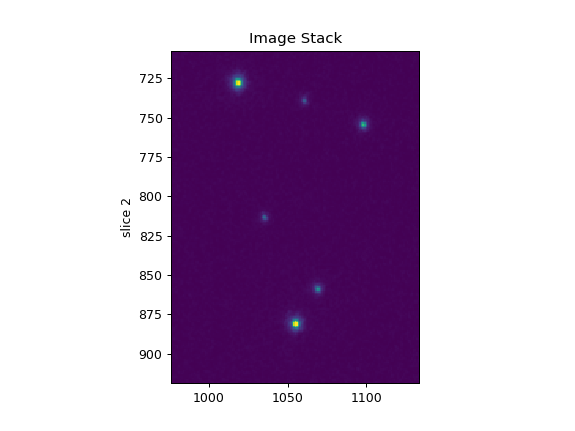

In [50]:
stkshow(reg_test)

<IPython.core.display.Javascript object>


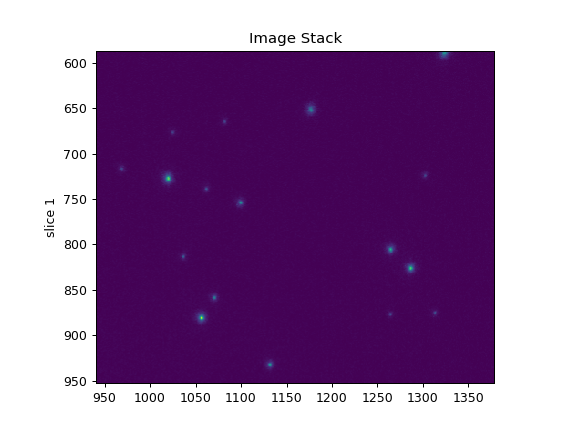

In [53]:
stkshow(reg_test2)

In [10]:
tforms = pickle.load(open('/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/results/test_tforms.pkl','rb'))

In [33]:
tforms['good']['Pos15']

{'hybe1': (array([0, 0, 0]), 0, inf),
 'hybe2': (array([-2.6802435 ,  2.14760307,  0.76916368]),
  0.19481336977711705,
  198),
 'hybe3': (array([ 4.08786107,  8.7152362 , -0.22990406]),
  0.2041521840851295,
  212),
 'hybe4': (array([8.95933177, 8.02836472, 0.06889727]),
  0.26113059432381336,
  181),
 'hybe5': (array([14.69234157,  8.29517835,  0.45375642]),
  0.3134027511843973,
  197),
 'hybe6': (array([20.05371637,  8.87307356, -0.93491273]),
  0.27127672311531675,
  196),
 'hybe7': (array([24.01887376,  8.14885269, -0.74950669]),
  0.28368784589295976,
  205),
 'hybe8': (array([25.25509196,  9.87749387, -0.94163093]),
  0.31817687493293517,
  190),
 'hybe9': (array([26.96315994, 11.0472956 , -1.20339988]),
  0.34746025346429477,
  199)}

In [34]:
tforms_old = pickle.load(open('/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/results/tforms.pkl','rb'))
tforms_old['good']['Pos15']

{'hybe1': (array([0, 0, 0]), 0, inf),
 'hybe2': (array([-2.99998648,  1.00001979,  1.00004135]),
  0.24552207444979154,
  482),
 'hybe3': (array([3.99999931, 9.00000811, 0.99999537]),
  0.2602868699631592,
  470),
 'hybe4': (array([7.00006884, 8.99999143, 0.99999681]),
  0.31134620420456277,
  515),
 'hybe5': (array([ 1.19866365e+01,  9.99999620e+00, -6.92506086e-05]),
  0.36762455201476674,
  501),
 'hybe6': (array([17.99996849, 13.00002656, -8.00000787]),
  0.31201243308235505,
  375),
 'hybe7': (array([21.00000714, 10.99994689, -0.2159843 ]),
  0.3643395486688517,
  386),
 'hybe8': (array([2.40000050e+01, 1.29978248e+01, 6.32606534e-05]),
  0.4424694213981738,
  495),
 'hybe9': (array([26.00000853, 13.00000359,  1.00007063]),
  0.333340097150048,
  452)}

In [27]:
dictionary[h]

,z,y,x,mass
0,21.882767,913.952594,5.379244,1.819581
1,42.004960,1721.823931,5.473652,1.880195
2,53.718227,179.086839,6.042515,2.577255
5,87.730667,620.961333,5.582000,1.748477
6,92.889278,261.073085,7.071335,2.663513
7,93.807165,866.937638,5.425918,2.635537
8,147.285488,1990.746174,5.226913,2.208909
9,156.297297,723.723938,5.315315,1.811422
10,164.209642,752.888995,5.430701,3.675298
11,184.314563,612.236893,5.297735,1.800931


<IPython.core.display.Javascript object>


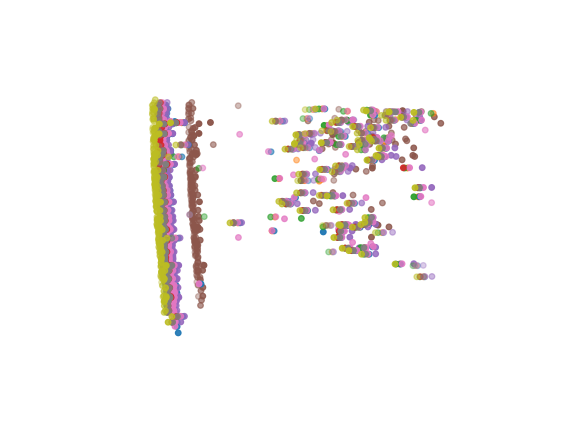

In [29]:
%matplotlib notebook
import pickle
beads = pickle.load(open('/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/results/beads.pkl','rb'))
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d, Axes3D
fig = plt.figure()
ax = Axes3D(fig)
pos = 'Pos15'
dictionary = full_test_beads[pos]
tform_dict = tforms['good'][pos]
for h in dictionary.keys():
    tZ,tY,tX = tform_dict[h][0]
    X, Y, Z = dictionary[h]['x'], dictionary[h]['y'], dictionary[h]['z']
    X = X+tX
    Y = Y+tY
    Z=Z+tZ
    cset = ax.scatter(X, Y, Z)
    ax.clabel(cset, fontsize=9, inline=1)
ax.grid(False)
plt.axis('off')
plt.show()

In [6]:
bead_dict['Pos0']['hybe1'][:,0:3].shape

(221, 3)

In [61]:
beads['Pos0']['hybe1'].shape

(626, 3)

In [380]:
bead_cord = test_beads['hybe1'].values[1,0:3]

In [ ]:
from analysis_scripts.find_tforms import *
hybe_dict = defaultdict(dict)
hybe_dict['Pos0'] = test_beads
tforms_dict = defaultdict(dict)
tforms_dict['good'] = defaultdict(dict)
tforms_dict['bad'] = defaultdict(dict)
pnames = list(hybe_dict.keys())
with multiprocessing.Pool(6) as ppool:
    for result in ppool.imap(ensembl_bead_reg, [{'posname': pos, 'hybe_dict': hybe_dict[pos]} for pos in pnames]):
        try:
            pos, results = result
        except:
            continue
            print(result)
        goodness = 0
        if type(results) != dict:
            print('No beads in', pos)
            continue
        else:
            for hybe in results.keys():
                print(results[hybe][1])
                if isinstance(results[hybe][0], str):
                    goodness = goodness + 1
                    print(pos, hybe, 'not enough bead pairs found')
                elif results[hybe][1] > args.max_thresh:
                    goodness = goodness + 1
                    print(pos, hybe, 'residual is too high',results[hybe][1]) 
            if goodness == 0:
                tforms_dict['good'][pos] = results
                print(pos, 'all good')
            else:
                tforms_dict['bad'][pos] = results
                print(pos, 'no bueno')
    print('Finished finding tforms')
    print(len(tforms_dict['good']), len(tforms_dict['bad']))
pickle.dump(tforms_dict,open(args.out_path,'wb'))


<IPython.core.display.Javascript object>


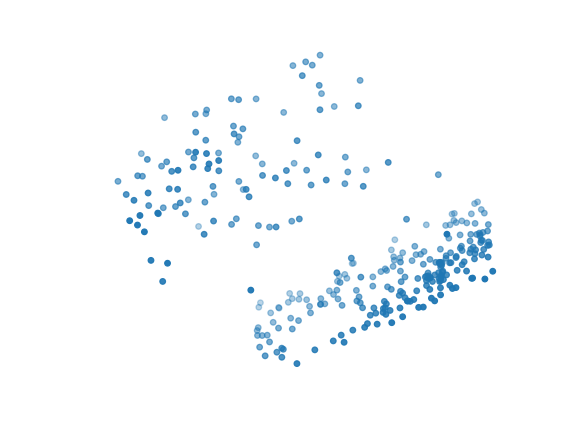

In [348]:
from mpl_toolkits.mplot3d import axes3d, Axes3D
fig = plt.figure()
ax = Axes3D(fig)
X=tracked['x']
Y=tracked['y']
Z=tracked['z']
cset = ax.scatter(X, Y, Z)
ax.clabel(cset, fontsize=9, inline=1)
ax.grid(False)
plt.axis('off')
plt.show()

<IPython.core.display.Javascript object>


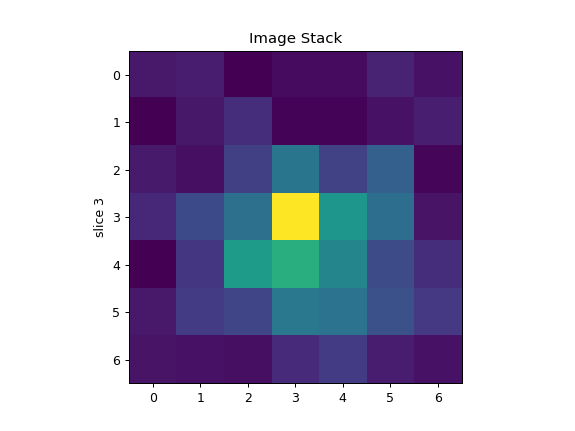

In [227]:
stkshow(norm_bead)

In [ ]:
hist, bins = np.histogram(norm2d.ravel(), normed=True, bins=100)
threshold = bins[np.cumsum(hist) * (bins[1] - bins[0]) > 0.8][0]
mnorm2d = np.ma.masked_less(norm2d,threshold)
com = ndimage.measurements.center_of_mass(mnorm2d)
plt.imshow(norm2d, origin="lower")
plt.scatter(*com[::-1])
plt.show()

In [48]:
%matplotlib notebook
import matplotlib.pyplot as plt
from __future__ import print_function
class stkshow(object):
    def __init__(self, X, min_thresh=10,max_thresh=99.999):
        self.fig, self.ax = plt.subplots(1,1)
        self.ax.set_title('Image Stack') # Title
        self.X = X
        rows, cols, self.slices = X.shape
        self.ind = 0
        self.vmin = np.percentile(self.X,min_thresh)
        self.vmax = np.percentile(self.X,max_thresh)
        self.im = self.ax.imshow(self.X[:, :, self.ind], vmin=self.vmin, vmax=self.vmax)
        self.fig.canvas.mpl_connect('scroll_event', self.onscroll)
        self.update()

    def onscroll(self, event):
        print("%s %s" % (event.button, event.step))
        if event.button == 'up':
            self.ind = (self.ind + 1) % self.slices
        else:
            self.ind = (self.ind - 1) % self.slices
        self.update()

    def update(self):
        self.im.set_data(self.X[:, :, self.ind])
        self.ax.set_ylabel('slice %s' % self.ind)
        self.im.axes.figure.canvas.draw()
        plt.show()
stkshow(test_bead)

NameError: name 'test_bead' is not defined

In [13]:
bead = next(iter(substacks.keys()))#for bead in substacks.keys():
from scipy import ndimage
substacks,keeplist = fetch_substacks(stk,peaks)
centers = {}
for bead in substacks.keys():
    center = ndimage.center_of_mass(substacks[bead])
    centers[bead] = bead

In [45]:
bead = next(iter(substacks.keys()))
print(bead)

(2038, 553, 15)


In [83]:
z = 7
#del z_beads
z_beads = (0,0,0)
for i in range(len(beads['Pos0']['hybe1'])):
    if beads['Pos0']['hybe1'][i][2] == z:
        if not 'z_beads' in locals():
            z_beads = np.transpose(beads['Pos0']['hybe1'][i])
        else:
            z_beads = np.dstack((z_beads,np.transpose(beads['Pos0']['hybe1'][i])))

In [88]:
z_beads[:,0]

array([[   0, 1824, 1235,  779,  525,  516,  467,  340,  314,  289,  188,
         175,  162,  153,  144,  143,  120,   37,   33,    9,    7,    3]])

In [91]:
plt.scatter(z_beads[:,0],z_beads[:,1])
plt.show()

In [63]:
if 'bead' in locals():
    print(bead)
else:
    print('nope')

(2038, 553, 15)


In [ ]:
import matplotlib.pyplot as plt
im = plt.imread(image_name)
implot = plt.imshow(im)

# put a blue dot at (10, 20)
plt.scatter([10], [20])

# put a red dot, size 40, at 2 locations:
plt.scatter(x=[30, 40], y=[50, 60], c='r', s=40)

plt.show()

<IPython.core.display.Javascript object>


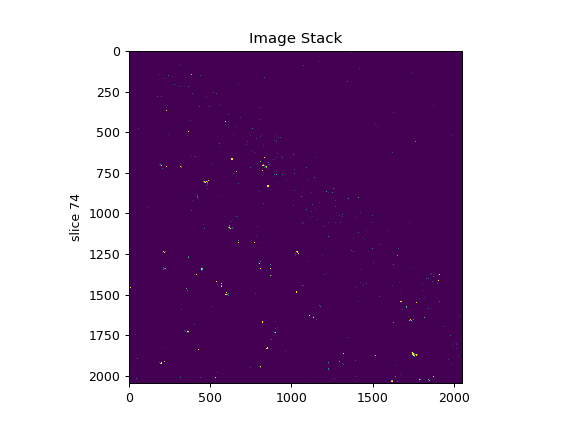

In [283]:
%matplotlib notebook
import matplotlib.pyplot as plt
from __future__ import print_function
class stkshow2(object):
    def __init__(self, Stack, Points, min_thresh=99.5,max_thresh=99.95):
        self.fig, self.ax = plt.subplots(1,1)
        self.ax.set_title('Image Stack') # Title
        self.X = Stack
        z_beads = {}
        for b in Points:
            if b[2] not in z_beads.keys():
                z_beads[b[2]] = (b[0],b[1])
            else:
                z_beads[b[2]] = np.dstack((z_beads[b[2]],(b[0],b[1])))
        self.P = z_beads
        rows, cols, self.slices = self.X.shape
        self.ind = 0
        if self.ind in self.P.keys():
            print(self.ind)
            #plt.scatter(self.P[self.ind][0],self.P[self.ind][1])
        self.vmin = np.percentile(self.X,min_thresh)
        self.vmax = np.percentile(self.X,max_thresh)
        self.im = self.ax.imshow(self.X[:, :, self.ind], vmin=self.vmin, vmax=self.vmax)
        self.fig.canvas.mpl_connect('scroll_event', self.onscroll)
        self.update()

    def onscroll(self, event):
        print("%s %s" % (event.button, event.step))
        if event.button == 'up':
            self.ind = (self.ind + 1) % self.slices
        else:
            self.ind = (self.ind - 1) % self.slices
        self.update()

    def update(self):
        try:
            plt.remove()
        except:
            pass
        self.im.set_data(self.X[:, :, self.ind])
        self.ax.set_ylabel('slice %s' % self.ind)
        self.im.axes.figure.canvas.draw()
        if self.ind in self.P.keys():
            print(self.ind)
            #plt.scatter(self.P[self.ind][0],self.P[self.ind][1])
        plt.show()
#stk = md.stkread(Channel='DeepBlue',Position='Pos0', hybe='hybe1')
stkshow2(stk,beads['Pos0']['hybe1'])

In [278]:
stk.shape

(2048, 2048, 81)

In [253]:
Points = beads['Pos0']['hybe1']
zbeads = {}
for b in Points:
    z = b[2]
    if z not in z_beads.keys():
        z_beads[z] = (b[0],b[1])
    else:
        z_beads[z] = np.dstack((z_beads[z],(b[0],b[1])))

In [269]:
z_beads[0][0]

KeyError: 0

In [258]:
plt.scatter(z_beads[15][0],z_beads[15][1])
plt.show()

In [96]:
from analysis_scripts.decon_codestacks import *
niter = 10
md_path = '/mnt/HypeScope/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/'
k = 1
zstart = 2
zskip = 3
zmax = 80
pos = 'Pos0'
out_path = '/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/codestacks'
os.environ['MKL_NUM_THREADS'] = '4'
os.environ['GOTO_NUM_THREADS'] = '4'
os.environ['OMP_NUM_THREADS'] = '4'
seqfish_config = importlib.import_module('seqfish_config_Inflammation')
#pfunc = partial(hdata_multi_z_pseudo_maxprjZ_wrapper, md_path=args.md_path, bitmap=seqfish_config.bitmap, k=args.k, zstart=args.zstart, zskip=args.zskip, zmax=args.zmax, cstk_save_dir=args.out_path, ndecon_iter=niter)
good_positions = pickle.load(open( '/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/results/tforms.pkl', 'rb'))['good']
z = {}
xy = {}
for hybe in good_positions[pos].keys():
    x = good_positions[pos][hybe][0][0]
    y = good_positions[pos][hybe][0][1]
    z[hybe] = good_positions[pos][hybe][0][2]
    xy[hybe] = (x,y)
pos_hdata = HybeData(os.path.join(out_path, pos))
hdata_multi_z_pseudo_maxprjZ_wrapper(pos_hdata,pos,xy,z,md_path,seqfish_config.bitmap,out_path,reg_ref='hybe1', zstart=2, k=1, zskip=3, zmax=80, ndecon_iter = 25)

In [119]:
pos_hdata = HybeData(os.path.join(out_path, pos))
hdata_multi_z_pseudo_maxprjZ_wrapper(pos_hdata,pos,xy,z,md_path,seqfish_config.bitmap,out_path,reg_ref='hybe1', zstart=2, k=1, zskip=3, zmax=80, ndecon_iter = 25)

opening img_Pos0_000000012_000000000_Orange_000_012.tif

KeyboardInterrupt: 

In [120]:
func_inputs = []
for p, t in good_positions.items():
    tforms_xyz = {k: (v[0][0], v[0][1], int(np.round(np.mean(v[0][2])))) for k, v in t.items()}
    txy = {k: (v[0], v[1]) for k, v in tforms_xyz.items()}
    tzz = {k: v[2] for k, v in tforms_xyz.items()}
    func_inputs.append((HybeData(os.path.join(out_path, p)), p, txy, tzz))

In [121]:
func_inputs

[(<fish_results.HybeData at 0x7efddbf57240>,
  'Pos0',
  {'hybe1': (0, 0),
   'hybe2': (-6.000004926816544, -0.5107952440394339),
   'hybe3': (2.0000389033955006, 10.00000231539709),
   'hybe4': (2.9999991928168033, 7.999980000807136),
   'hybe5': (7.99991124031123, 8.999998763426088),
   'hybe6': (15.00002716380217, 11.000023777276766),
   'hybe7': (17.000027811535986, 10.000016551693701),
   'hybe8': (23.999985899202148, 13.995188303196569),
   'hybe9': (22.99899737767882, 10.008236871146186)},
  {'hybe1': 0,
   'hybe2': 1,
   'hybe3': 0,
   'hybe4': 1,
   'hybe5': 0,
   'hybe6': 0,
   'hybe7': 0,
   'hybe8': 0,
   'hybe9': 0}),
 (<fish_results.HybeData at 0x7efddbf57588>,
  'Pos1',
  {'hybe1': (0, 0),
   'hybe2': (-5.000002219058095, -1.3136250507456468e-05),
   'hybe3': (3.0000235235851154, 9.99314831468378),
   'hybe4': (4.000025142415943, 7.999985850836071),
   'hybe5': (8.000006859065058, 9.053918912556668),
   'hybe6': (15.013479204398916, 10.985942235115491),
   'hybe7': (18.0

In [15]:
from pyvis import *
import metadata

In [10]:
from pyvis import *
md_path = '/bigstore/Images2018/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/'
from metadata import *
md = Metadata(md_path)
stk = md.stkread(Channel='DeepBlue',hybe='hybe1',Position='Pos0')

In [24]:
import matplotlib
%matplotlib notebook
from pyvis import *
stkshow(stk)

<IPython.core.display.Javascript object>

NameError: name 'np' is not defined

In [4]:
from metadata import*
path = '/mnt/HypeScope/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17'
md = Metadata(path)
nucstk = md.stkread(Channel='DeepBlue',acq='nucstain_1',Position='Pos0')

opening img_Pos0_000000081_000000000_DeepBlue_000_081.tif

<IPython.core.display.Javascript object>


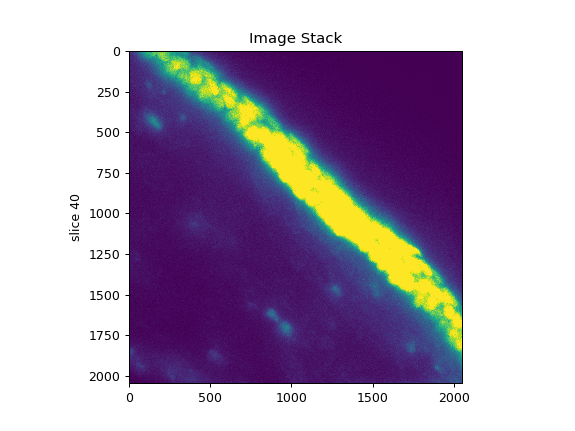

In [114]:
%matplotlib notebook
from pyvis import stkshow
stkshow(nucstk)

<IPython.core.display.Javascript object>


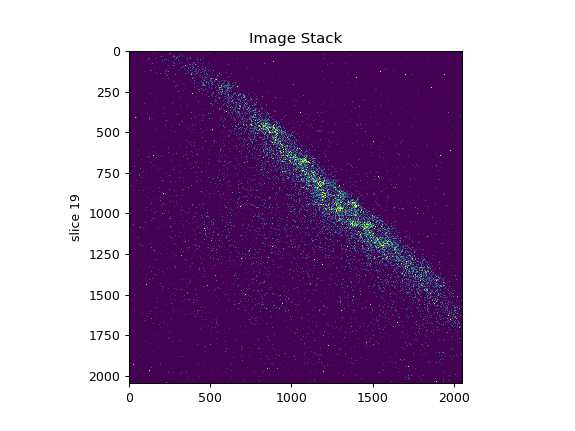

In [113]:
%matplotlib notebook
stkshow(orangestk,min_thresh=90,max_thresh=99.9)

In [3]:
        elif dtype == 'mask':
            fname = "mask_{0}{1}{2}.tif".format(posname, sep, zindex)
        relative_fname = os.path.join(fname)
        elif dtype == 'mask':
            dout = tifffile.imread(full_fname).astype(np.int16)
            dout = np.swapaxes(np.swapaxes(dout,0,2),0,1)

mask


'/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/codestacks/Pos0/mask_Pos0_z_1.tif'

<IPython.core.display.Javascript object>


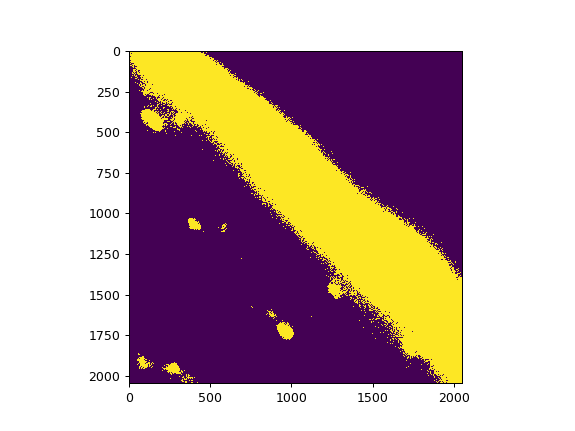

In [27]:
%matplotlib notebook
import matplotlib.pyplot as plt
import numpy as np
import copy
Stack = copy.copy(nucstk)
Stack = Stack[:,:,20]
thresh = np.percentile(Stack,70)
Stack[Stack<thresh]=0
Stack[Stack>=thresh]=1
plt.imshow(Stack)

In [ ]:
%matplotlib inline
img = nuc_stk[:,:,20]
img_blur = ndimage.gaussian_filter(img,1)
nuclei_thresh = threshold_adaptive(img_blur, 111)
nuclei_erode = ndimage.binary_erosion(nuclei_thresh, structure=selem.disk(4))
nuclei_dialate = ndimage.binary_dilation(nuclei_erode, structure=selem.disk(1))
nuclei_remove = remove_small_objects(nuclei_dialate, min_size=1500)
nuclei_fill = ndimage.binary_fill_holes(nuclei_remove)
nuclei_fill_erode = ndimage.binary_erosion(nuclei_fill, structure=selem.disk(3))
labels, num_label = label(nuclei_fill_erode, background=0, return_num=True, connectivity=1)


<IPython.core.display.Javascript object>


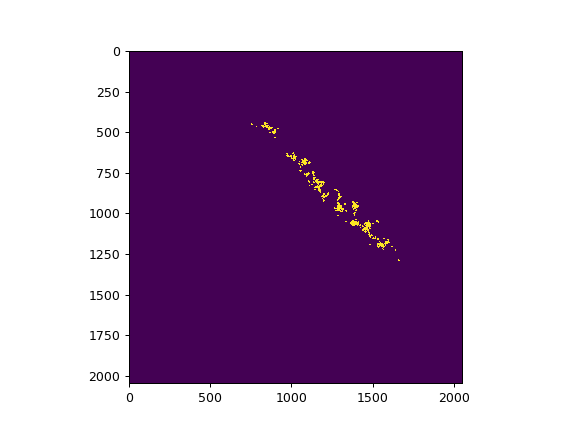

In [38]:
%matplotlib notebook
from scipy import ndimage
erode = ndimage.binary_erosion(Stack)#,structure=selem.disk(4))
dialate = ndimage.binary_dilation(erode,iterations=50)
plt.imshow(dialate)

In [39]:
from metadata import*
path = '/mnt/HypeScope/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17'
md = Metadata(path)
orangestk = md.stkread(Channel='Orange',hybe='hybe1',Position='Pos0')
redstk = md.stkread(Channel='FarRed',hybe='hybe1',Position='Pos0')

opening img_Pos0_000000081_000000000_FarRed_000_081.tif

<IPython.core.display.Javascript object>


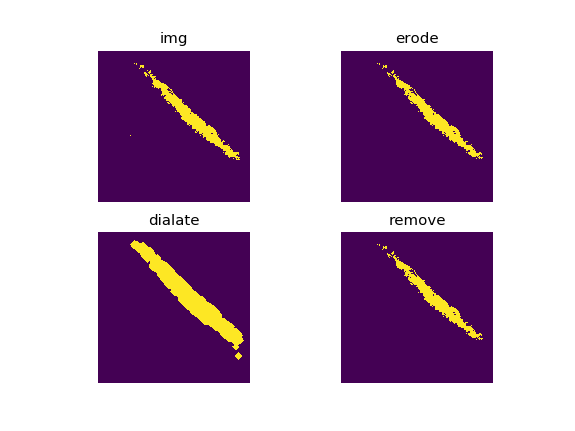

/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


(-0.5, 2047.5, 2047.5, -0.5)

In [120]:
Stack = copy.copy(orangestk)
img = Stack[:,:,20]
img = ndimage.gaussian_filter(img,4)
thresh = np.percentile(img,95)
img[img<thresh]=0
img[img>=thresh]=1
erode = ndimage.binary_erosion(img,iterations=2)
remove = remove_small_objects(erode, min_size=5)
dialate = ndimage.binary_dilation(remove,iterations=50)
fill = ndimage.binary_fill_holes(dialate)

%matplotlib notebook
plt.subplot(221)
plt.imshow(img)
plt.title('img')
plt.axis('off')
plt.subplot(222)
plt.imshow(erode)
plt.title('erode')
plt.axis('off')
plt.subplot(223)
plt.imshow(remove)
plt.title('remove')
plt.axis('off')
plt.subplot(224)
plt.imshow(dialate)
plt.title('dialate')
plt.axis('off')
plt.subplot(224)
plt.imshow(fill)
plt.title('fill')
plt.axis('off')


<IPython.core.display.Javascript object>


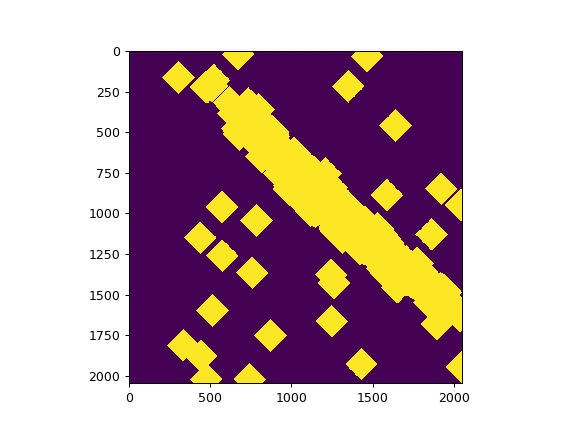

In [83]:
%matplotlib notebook
Stack = copy.copy(orangestk)
img = Stack[:,:,50]
img = ndimage.gaussian_filter(img,2)
thresh = np.percentile(img,99)
img[img<thresh]=0
img[img>=thresh]=1
erode = ndimage.binary_erosion(img,iterations=2)
dialate = ndimage.binary_dilation(erode,iterations=100)
plt.imshow(dialate)

<IPython.core.display.Javascript object>


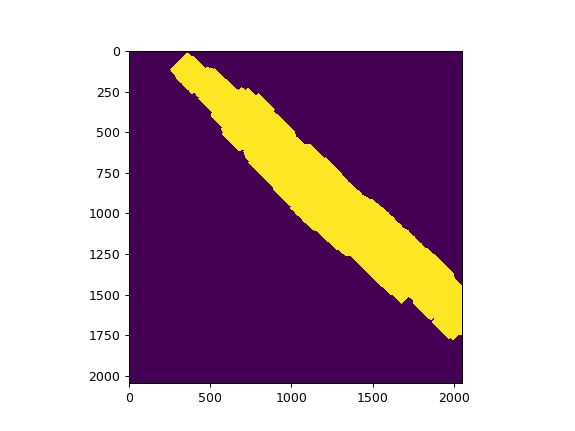

In [91]:
%matplotlib notebook
orange = copy.copy(orangestk)
red = copy.copy(redstk)

Stack = copy.copy(orangestk)
img = Stack[:,:,50]
img = ndimage.gaussian_filter(img,4)
thresh = np.percentile(img,95)
img[img<thresh]=0
img[img>=thresh]=1
combo = copy.copy(img)

Stack = copy.copy(redstk)
img = Stack[:,:,50]
img = ndimage.gaussian_filter(img,4)
thresh = np.percentile(img,95)
img[img<thresh]=0
img[img>=thresh]=1
combo = combo+img

erode = ndimage.binary_erosion(combo,iterations=3)
dialate = ndimage.binary_dilation(erode,iterations=100)
plt.imshow(dialate)

<IPython.core.display.Javascript object>


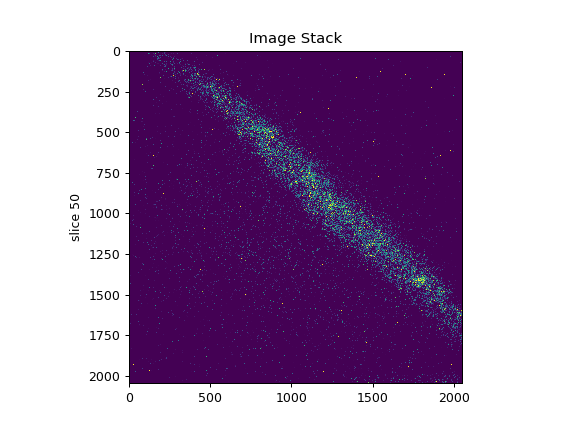

In [65]:
%matplotlib notebook
stkshow(orangestk,min_thresh=90,max_thresh=99.9)

<IPython.core.display.Javascript object>


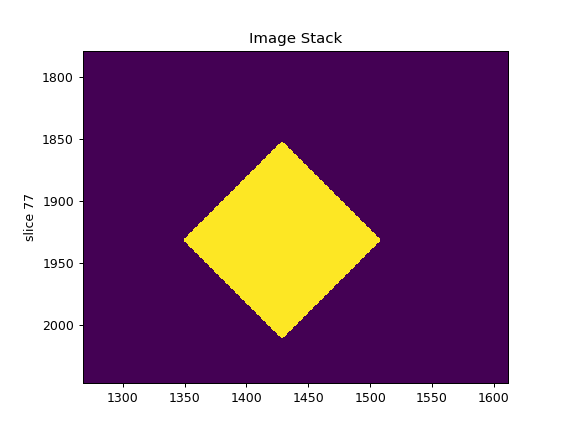

In [92]:
%matplotlib notebook
orange = copy.copy(orangestk)
red = copy.copy(redstk)

Stack = copy.copy(orangestk)
Stack = ndimage.gaussian_filter(Stack,4)
thresh = np.percentile(Stack,95)
Stack[Stack<thresh]=0
Stack[Stack>=thresh]=1
combo = copy.copy(Stack)

Stack = copy.copy(redstk)
Stack = ndimage.gaussian_filter(Stack,4)
thresh = np.percentile(Stack,95)
Stack[Stack<thresh]=0
Stack[Stack>=thresh]=1
combo = combo+Stack

erode = ndimage.binary_erosion(combo,iterations=3)
dialate = ndimage.binary_dilation(erode,iterations=100)
stkshow(dialate)

<IPython.core.display.Javascript object>


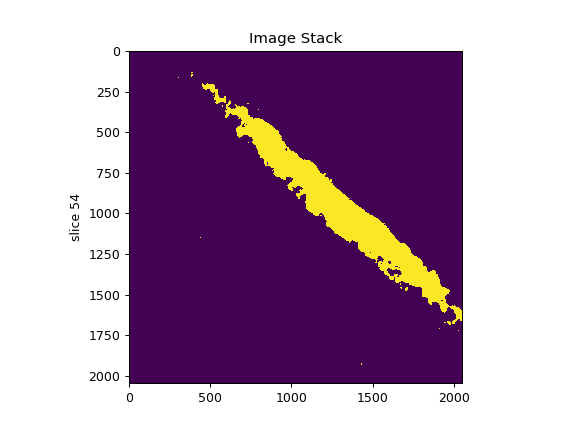

In [94]:
%matplotlib notebook
stkshow(combo)

In [160]:
import pickle
full_test_beads = {}
pickle.dump(full_test_beads,open('/hybedata/Zach/FISH_Troubleshooting/Transverse_Wound_First_2018Sep17/full_test_beads.pkl','wb'))